In [1]:
import sys
import os
from time import time
import pymc as pm
%matplotlib inline
from IPython.core.pylabtools import figsize
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multinomial
from typing import List
import scipy.stats as stats
import pytensor.tensor as at
import pytensor.tensor.slinalg as sla
import pytensor
import warnings
import arviz as az
print(f"Running on PyMC v{pm.__version__}")
warnings.simplefilter(action="ignore", category=FutureWarning)
#from easydl import clear_output
from IPython.display import clear_output

Running on PyMC v5.2.0


In [2]:
from nuscenes.nuscenes import NuScenes
from nuscenes.eval.prediction.splits import get_prediction_challenge_split
from nuscenes.prediction import PredictHelper
from nuscenes.prediction.input_representation import static_layers
from nuscenes.map_expansion.bitmap import BitMap
from nuscenes.map_expansion import arcline_path_utils
from pyquaternion import Quaternion
from nuscenes.eval.common.utils import quaternion_yaw

In [3]:
from utils_map import *

In [4]:
hyper_parameters = {
    'split' : 'val',
    'data_root' : '/home/hncui/share/Nuscenes/nu_data',

    'num_states' : 21,      #HMM相关超参数
    'acc_min' : -5,         #最小加速度
    'acc_max' : 5,          #最大加速度
    'acc_sigma' : 0.15,     #加速度方差
    'psi_min' : -0.3,       #最小转向角
    'psi_max' : 0.3,        #最大转向角
    'psi_sigma' : 0.01,     #转向角方差
    'dt' : 0.5,             #时间间隔
    'pre_calculated' : True,#是否使用提前计算好的参数
    
    #地图生成超参数

    'discretization_resolution_meters' : 1, #车道分割分辨率
    'lane_node_radius' : 5, #车道搜索后继结点半径
    'lane_direction_threshold' : np.pi / 2,  #车道后继节点方向阈值，大于该值不作为后继节点
    
    #输入数据超参数
    'data_input_radius' : 20,   #输入数据中周围移动物体检测半径
    
    #sample 超参数
    'bezier_factor' : 5, #贝塞尔距离乘系数
    'bezier_offset' : 5, #贝塞尔距离偏移系数
    'bezier_exp' : 5, #贝塞尔指数系数
    
    
}

In [5]:
DATAROOT=hyper_parameters['data_root']
nusc = NuScenes(version='v1.0-trainval', dataroot=DATAROOT, verbose=True)   # v1.0-trainval     v1.0-mini
helper = PredictHelper(nusc)
token_list = get_prediction_challenge_split(hyper_parameters['split'], dataroot=DATAROOT)    # train val mini_train mini_val四个数据集
maps = static_layers.load_all_maps(helper)

Loading NuScenes tables for version v1.0-trainval...
23 category,
8 attribute,
4 visibility,
64386 instance,
12 sensor,
10200 calibrated_sensor,
2631083 ego_pose,
68 log,
850 scene,
34149 sample,
2631083 sample_data,
1166187 sample_annotation,
4 map,
Done loading in 244.087 seconds.
Reverse indexing ...
Done reverse indexing in 68.6 seconds.


In [6]:
Vertices_maps, Edges_maps, ordered_x_maps, ordered_y_maps, lanes_vertices = generate_maps(maps) #生成地图
#   Vertices_maps:dict(),key为地图名,value为各个地图中的节点集
#   Edges_maps:同上，边集
#   ordered_x_maps:同上，按照x坐标排序的点集
#   ordered_y_maps:同上，按照y坐标排序的点集
#   lane_vertices:dict(),key为车道token，value为车道点列表
lane_dir_diffs = set_lanes_mode(lanes_vertices) #计算车道为左转、直行、右转中的哪一个

In [7]:
X = [] #输入数据

for token in token_list:
    instance_token, sample_token = token.split('_')
    ann = helper.get_sample_annotation(instance_token, sample_token)
    X.append(ann)

In [8]:
%load_ext autoreload
%autoreload 2
from utils_sample import *
import copy
from utils_social_field import *
from utils_data_input import get_label, get_sample_input, get_moving_static_inputs
colors = {
    'animal':'aqua',
    'human':'green',
    'object':'grey',
    'cycle':'yellow',
    'vehicle':'blue',
    'lane':'tan'
}

In [9]:
gt_all, subsequences_X = get_label(helper, X)       #计算ground truth
sample_input = get_sample_input(helper, nusc, X)    #输入数据按类型分类
static_inputs, moving_inputs, moving_anns = get_moving_static_inputs(X, sample_input, helper) 
#静态障碍物，移动障碍物

In [10]:
from matplotlib.patches import Rectangle

In [11]:
from utils_HMM import get_HMM
N_STATES = hyper_parameters['num_states']
mu_a = np.linspace(-5,5,N_STATES)
mu_psi = np.linspace(-0.3, 0.3, N_STATES)
if hyper_parameters['pre_calculated']:
    P_trans_a_history = np.load('./checkpoints/P_trans_a_history_np3.16_2.npy')
    P_trans_psi_history = np.load('./checkpoints/P_trans_psi_history_np3.16_2.npy')
else:
    P_trans_a_history, P_trans_psi_history = get_HMM(nusc, helper, token_list, hyper_parameters)
p_trans_a = P_trans_a_history[-1]
p_trans_psi = P_trans_psi_history[-1]
#p_trans_a = np.load('/home/hncui/data/Nuscenes/mypython/HMM_V3/P_trans_a_3.17_1_21states.npy')
#p_trans_psi = np.load('/home/hncui/data/Nuscenes/mypython/HMM_V3/P_trans_psi_3.17_1_21states.npy')
p_trans_a = p_trans_a / p_trans_a.sum(axis = 1)
p_trans_psi = p_trans_psi / p_trans_psi.sum(axis = 1)
def np_solve_equilibrium(p_transition):
    n_states = len(p_transition)
    A = np.eye(n_states) - p_transition + np.ones(shape=(n_states,n_states))
    p_equilibrium = np.linalg.solve(A.T,np.ones(shape=(n_states)))
    return p_equilibrium
p_eq_a = np_solve_equilibrium(p_trans_a)
p_eq_psi = np_solve_equilibrium(p_trans_psi)
p_eq_a = p_eq_a / p_eq_a.sum()
p_eq_psi = p_eq_psi / p_eq_psi.sum()
true_sigma_a = np.ones(N_STATES) * 0.15
true_sigma_psi = np.ones(N_STATES) * 0.01

Running on PyMC v5.2.0


In [12]:
psi_rv = stats.norm(loc = mu_psi, scale = true_sigma_psi)
a_rv = stats.norm(loc = mu_a, scale = true_sigma_a)

model = pm.Model()
with model:
    P_trans = pm.MutableData('P_trans', p_trans_a)
    mu = pm.MutableData('mu', np.ones(N_STATES))
    sigma  = pm.MutableData('sigma', np.ones(N_STATES))
    obs_seq = pm.MutableData('obs_seq', np.ones((5,1)))
    P_init = pm.Dirichlet('P_init', a=np.ones((N_STATES,)), shape=(N_STATES,))
    a = pm.DensityDist('a', mu, sigma, P_init, P_trans, N_STATES, logp=mylogp, observed = obs_seq)

In [13]:
eps = 1e-100
v_fix_vector = np.arange(N_STATES) - (N_STATES // 2)
k_v = 1e-0
v_mean = 6.2541808327494905
a_rvs = []
psi_rvs = []
for i in range(N_STATES):
    a_rvs.append(stats.norm(loc = mu_a[i], scale = true_sigma_a[i]))
    psi_rvs.append(stats.norm(loc = mu_psi[i], scale = true_sigma_psi[i]))

In [14]:
all_agents = []
all_moving = []
all_static = []
from utils_data_input import get_field_input
for i in range(0, len(X)):
    main_agent = X[i]
    sample_token = main_agent['sample_token']
    instance_token = main_agent['instance_token']
    moving_agents = moving_anns[instance_token + '_' + sample_token]

    predict_agents = moving_agents + [main_agent]
    moving_input = copy.deepcopy(moving_inputs[instance_token + '_' + sample_token])
    get_field_input(main_agent, None, moving_input, True, helper = helper)
    static_input = static_inputs[instance_token + '_' + sample_token]

    all_agents.append(predict_agents)
    all_moving.append(moving_input)
    all_static.append(static_input)

In [15]:
def plot_agent(annotation, ax, clr = None):
    width = annotation['size'][1]
    height = annotation['size'][0]
    translation = annotation['translation']
    xy = (translation[0] - width / 2, translation[1] - height / 2)
    angle = quaternion_yaw(Quaternion(annotation['rotation'])) / np.pi * 180
    if clr is None:
        clr = 'green'
    if clr == 'red' or clr == '#E51400':
        box = Rectangle(xy, width, height, angle = angle, rotation_point = 'center', color = clr, alpha = 0.6)
    else:
        box = Rectangle(xy, width, height, angle = angle, rotation_point = 'center', color = clr, alpha = 0.3)
    ax.add_patch(box)
    ax.set_xlim(translation[0] - 30, translation[0] + 30)
    ax.set_ylim(translation[1] - 30, translation[1] + 30)
def plot_lane(lane, closest_idx, ax):
    x = []
    y = []
    yaw = []
    for node in lane:
        x.append(node.coors[0])
        y.append(node.coors[1])
        yaw.append(node.direction)
    for i in range(len(x) - 1):
        ax.arrow(x[i], y[i], x[i+1] - x[i], y[i+1] - y[i], length_includes_head = True, head_width = 0.0, color = 'gray', alpha = 1, linewidth = 3, linestyle = '-')
    ax.arrow(x[-1], y[-1], np.cos(yaw[-1]), np.sin(yaw[-1]), length_includes_head = True, head_width = 0.0, color = 'gray', alpha = 1, linewidth = 3, linestyle = '-')
    if closest_idx is not None:
        ax.scatter(x[closest_idx], y[closest_idx])

In [16]:
def get_closest_node(lane_nodes, add_idx, x, y):
    closest_idx = -1
    clo_dis = 1e9
    for i in range(len(lane_nodes)):
        dis = np.sqrt(((lane_nodes[i].coors - np.array([x,y])) ** 2).sum())
        if dis < clo_dis:
            clo_dis = dis
            closest_idx = i
    if clo_dis < add_idx:
        closest_idx += int(add_idx - clo_dis)
    closest_idx = min(closest_idx, len(lane_nodes)-1)
    return clo_dis, lane_nodes[closest_idx]

In [17]:
def predict_step_test(scene : Scene, pa_scene, Vertices, Vertices_ordered_x, Vertices_ordered_y, p_trans_a,
                 p_trans_psi, N_STATES, a_rvs, psi_rvs, lanes_vertices, 
                 psi_rv, map, step, candidate_lanes_dict, lane_nodes):#, use_times, lane_idxes, ans_nodes, psi_his):
    num_agents = len(scene.x[0])
    t_x = []
    t_y = []
    t_v = []
    t_yaw = []
    t_a_state = []
    t_psi_state = []
    t_a = []
    all_lanes = []
    lane_choosed = []
    if step == 0:
        offsets = []
        target_v = get_target_v()
    else:
        offsets = scene.offsets
        target_v = scene.target_v
    if len(scene.self_weight):
        scene_idx = np.random.choice(a = len(scene.self_weight), p = scene.self_weight)
    else:
        scene_idx = -1
    for i in range(num_agents):
        x = scene.x[-1][i]
        y = scene.y[-1][i]
        v = scene.v[scene_idx][i]
        yaw = scene.yaw[scene_idx][i]
        a_state = scene.a_states[scene_idx][i]
        psi_state = scene.psi_states[scene_idx][i]

        candidate_lanes = copy.deepcopy(scene.candidate_lanes[i])
        lanes_token = list(candidate_lanes.keys())

        flag = True
        count = 0
        while flag:
            v_weight = calc_v_weight(v)
            p_trans_a_fix = p_trans_a[a_state] * v_weight
            p_trans_a_fix = p_trans_a_fix / p_trans_a_fix.sum()
            #p_trans_a_fix = p_trans_a[a_state]
            next_a = np.random.choice(N_STATES, p = p_trans_a_fix) 
            a = a_rvs[next_a].rvs()
            next_v = v + a * dt

            count += 1
            if count <= 10 and next_v < -0.3:
                continue
            
            if len(lanes_token) > 0:#周围有车道
                if step == 0:
                    temp_values = np.array(list(candidate_lanes.values()))
                    distance = temp_values[:,0] ** 5
                    min_dis = temp_values[:,2].min()
                    d_weight = (temp_values[:,2] - min_dis) ** 2 + 1e-2
                    distance = distance / d_weight
                    distance = distance / distance.sum()
                    lane_idx = np.random.choice(len(distance), p = distance)
                    lane_token = lanes_token[lane_idx]

                else:
                    lane_token = scene.lane_token[i]
                    if lane_token == None or lane_token not in candidate_lanes:
                        temp_values = np.array(list(candidate_lanes.values()))
                        distance = temp_values[:,0] ** 5
                        min_dis = temp_values[:,2].min()
                        d_weight = (temp_values[:,2] - min_dis) ** 2 + 1e-2
                        distance = distance / d_weight
                        distance = distance / distance.sum()
                        lane_idx = np.random.choice(len(distance), p = distance)
                        lane_token = lanes_token[lane_idx]

                add_idx = int(abs(next_v) * dt + 1)
                if len(lanes_vertices[lane_token]) > 30:
                    add_idx = add_idx * 4
                
                eucli_dis, node = get_closest_node(lane_nodes, add_idx, x, y)
                
            if node is None or len(lanes_token) == 0:#没有车道可指引
                p_trans = p_trans_psi[psi_state]
                if step == 0:
                    offsets.append(0)
            else:
                if step == 0:
                    dir_diff = diff_direction(node.direction, yaw)
                    if eucli_dis < 5 and dir_diff < 0.3:
                        offset = calc_lane_offset(x, y, node)
                        rand_off = np.random.rand() * 5
                        if rand_off < abs(offset):
                            offset = 0
                    else:
                        offset = 0
                    offsets.append(offset)
                else:
                    offset = offsets[i]

                if offset != 0:
                    offset_x = offset * np.cos(node.direction + np.pi / 2)
                    offset_y = offset * np.sin(node.direction + np.pi / 2)
                    node_x = node.coors[0] + offset_x
                    node_y = node.coors[1] + offset_y
                else:
                    node_x = node.coors[0]
                    node_y = node.coors[1]

                temp_psi = diff_direction(np.arctan2(node_y - y, node_x - x), yaw)
                temp_psi = np.clip(temp_psi, -0.3, 0.3)

                p_trans = p_trans_psi[psi_state] * (psi_rv.pdf(temp_psi) + eps)
                p_trans = p_trans / p_trans.sum()
            next_psi = np.random.choice(N_STATES, p = p_trans)
            psi = psi_rvs[next_psi].rvs()

            next_yaw = yaw + psi
            dx = next_v * np.cos(next_yaw) * dt
            dy = next_v * np.sin(next_yaw) * dt
            next_x = x + dx
            next_y = y + dy
            flag = False
            
        key = (int(next_x+0.5), int(next_y+0.5), int(next_yaw*10+0.5))
        if key in candidate_lanes_dict:
            candidate_lanes = candidate_lanes_dict[key]
        else:
            update_candidate_lanes(candidate_lanes, x, y, next_x, next_y, next_yaw, next_v, Vertices, Vertices_ordered_x, Vertices_ordered_y,
                                   lanes_vertices)#, use_times)
            candidate_lanes_dict[key] = candidate_lanes
        if len(lanes_token) == 0:
            lane_choosed.append(None)
        else:
            lane_choosed.append(lane_token)
        t_x.append(next_x)
        t_y.append(next_y)
        t_v.append(next_v)
        t_yaw.append(next_yaw)
        t_a_state.append(next_a)
        t_psi_state.append(next_psi)
        t_a.append(a)
        all_lanes.append(candidate_lanes)
    ans = Scene(t_x, t_y, t_v, t_yaw, scene.lane_idx[scene_idx], t_a_state, t_psi_state, pa_scene)
    ans.valid = count <= 10
    ans.a = [t_a]
    ans.set_lane(lane_choosed) #保存选择的车道
    ans.set_offsets(offsets)
    ans.set_candidate_lanes(all_lanes)
    ans.set_target_v(target_v)
    return ans

In [18]:
def sample_predict_func_4(predict_agents, moving_input, static_input, helper, 
                         model, p_trans_a, mu_a, true_sigma_a, p_trans_psi, 
                         mu_psi, true_sigma_psi, a_rv, psi_rv, p_eq_a, p_eq_psi, 
                         maps, Vertices_maps, ordered_x_maps, ordered_y_maps, a_rvs, 
                         psi_rvs, lanes_vertices, sample_idx, seed, lane_nodes):
    #return x,y
    print(f'start:{sample_idx}')
    np.random.seed(seed)
    t1 = time.perf_counter()
    init_all_x = []
    init_all_y = []
    init_all_v = []
    init_all_yaw = []
    init_all_a_state = []
    init_all_psi_state = []
    for j in range(len(predict_agents)):
        #init_x, init_y, init_v, init_yaw, a_init, psi_init = calc_init_state(predict_agents[j], helper, N_STATES, model, p_trans_a, 
        #                                                                     mu_a, true_sigma_a, p_trans_psi, mu_psi, true_sigma_psi,
        #                                                                     a_rv, psi_rv, p_eq_a, p_eq_psi)
        init_x, init_y, init_v, init_yaw, a_init, psi_init = calc_init_state_2(predict_agents[j], helper, N_STATES, model, p_trans_a, 
                                                                             mu_a, true_sigma_a, p_trans_psi, mu_psi, true_sigma_psi,
                                                                             a_rv, psi_rv, p_eq_a, p_eq_psi)
        init_all_x.append(init_x)
        init_all_y.append(init_y)
        init_all_v.append(init_v)
        init_all_yaw.append(init_yaw)
        init_all_a_state.append(a_init)
        init_all_psi_state.append(psi_init)

    lanes_nodes = []
    lanes_x = []
    lanes_y = []
    temp_num_lanes = []
    sample_token = predict_agents[-1]['sample_token']
    map_name = helper.get_map_name_from_sample_token(sample_token)
    map = maps[map_name]
    Vertices = Vertices_maps[map_name]
    Vertices_ordered_x = ordered_x_maps[map_name]
    Vertices_ordered_y = ordered_y_maps[map_name]
    
    all_lanes = []
    candidate_lanes_dict = dict()
    for j in range(len(predict_agents)):
        temp_xy = np.array([init_all_x[j], init_all_y[j]])
        adj_nodes = lane_nodes
        lanes_closest = dict()
        v = init_all_v[j]
        yaw = init_all_yaw[j]
        for node in adj_nodes:
            bezier_dis = calc_bezier(temp_xy, v, yaw, node)
            euclidean_dis = np.sqrt(((temp_xy - node.coors) ** 2).sum())
            if node.lane_token in lanes_closest:
                if lanes_closest[node.lane_token][0] < bezier_dis:
                    lanes_closest[node.lane_token][0] = bezier_dis
                    lanes_closest[node.lane_token][1] = node.lane_idx
                if lanes_closest[node.lane_token][2] > euclidean_dis:
                    lanes_closest[node.lane_token][2] = euclidean_dis
                    lanes_closest[node.lane_token][3] = node.lane_idx
                
            else:
                lanes_closest[node.lane_token] = [0] * 4
                lanes_closest[node.lane_token][0] = bezier_dis
                lanes_closest[node.lane_token][1] = node.lane_idx
                lanes_closest[node.lane_token][2] = euclidean_dis
                lanes_closest[node.lane_token][3] = node.lane_idx
        key = (int(temp_xy[0]+0.5), int(temp_xy[1]+0.5), int(yaw*10 + 0.5))
        candidate_lanes_dict[key] = lanes_closest
        all_lanes.append(lanes_closest)

    ans = []
    all_nodes = []
    root_scene = Scene()
    root_scene.set_glob_idx(all_nodes)
    for j in range(repeat):
        #lane_idx = []
        a_states = []
        psi_states = []
        for k in range(len(predict_agents)):
            #lane_idx.append(np.random.choice(len(lanes_nodes[k])))
            a_states.append(np.random.choice(N_STATES, p = init_all_a_state[k]))
            psi_states.append(np.random.choice(N_STATES, p = init_all_psi_state[k]))
        temp_scene = Scene(init_all_x, init_all_y, init_all_v, init_all_yaw, None, a_states, psi_states, root_scene)
        temp_scene.set_glob_idx(all_nodes)
        temp_scene.set_pa(all_nodes)
        temp_scene.set_candidate_lanes(all_lanes)
        ans.append(temp_scene)
    init_risk_threshold = init_scene_risk(temp_scene, static_input, moving_input)
    t_count = []
    #use_times = [0] * 5
    #lane_idxes = []
    #ans_nodes = []
    #psi_his = []
    
    for j in range(steps):#steps
        #clear_output()
        #print(j)
        
        num_ans = len(ans)
        temp_ans = []
        count1 = 0
        count2 = 0
        if num_ans == 0:
            print(f'error:{sample_idx}, use time:{time.perf_counter() - t1}')
            return None, None, t_count
        #t_sum = 0
        #check_time = 0
        pre_rej = -1
        rej_cnt = 0
        while(count2 < repeat and count1 < repeat * 10):
            #if count1 % 1000 == 0:
            #    print(count1, t_sum, check_time)
                #print(temp_scene.pa_scene)
            #    t_sum = 0
            #    check_time = 0
            idxes = np.random.permutation(num_ans)
            for idx in idxes:
                if count2 >= repeat:
                    break
                count1 += 1
                #t1 = time.perf_counter()
                temp_scene = predict_step_test(ans[idx], ans[idx], Vertices, Vertices_ordered_x, Vertices_ordered_y,
                                        p_trans_a, p_trans_psi, N_STATES, a_rvs, psi_rvs,
                                        lanes_vertices, psi_rv, map, j, candidate_lanes_dict,lane_nodes)
                #t2 = time.perf_counter()
                #use_times[0] += t2 - t1

                if temp_scene.valid:
                    if rej_cnt > 150:
                        if pre_rej == len(predict_agents) - 1:
                            init_risk_threshold[pre_rej] *= 1.2
                        else:
                            init_risk_threshold[pre_rej] = 1
                        rej_cnt = 0
                    #t1 = time.perf_counter()
                    flag, rej = check_scene(temp_scene, static_input, moving_input, init_risk_threshold)
                    #t2 = time.perf_counter()
                    #use_times[2] += t2 - t1

                    if not flag:
                        count2 += 1
                        rej_cnt = 0
                        temp_scene.set_glob_idx(all_nodes)
                        temp_scene.set_pa(all_nodes)
                        temp_ans.append(temp_scene)
                    else:
                        if rej == pre_rej:
                            rej_cnt += 1
                        else:
                            pre_rej = rej
                            rej_cnt = 0    
                #t3 = time.perf_counter()
                #check_time += t3 - t2
        
        ans = temp_ans
        t_count.append((count1, count2, len(ans)))
    
    visited = set()
    dfs_delete_useless(all_nodes[0], 0, all_nodes, visited)
    num_ans = len(ans)
    temp_x = np.zeros((num_ans,12))
    temp_y = np.zeros((num_ans,12))
    all_x = []
    all_y = []
    t_x = []
    t_y = []
    dfs2(root_scene, 0, all_nodes, t_x, t_y, all_x, all_y)
    for j in range(num_ans):
        for k in range(12):
            temp_x[j][k] = all_x[j][k][-1]
            temp_y[j][k] = all_y[j][k][-1]

    print(f'end:{sample_idx}, use time:{time.perf_counter() - t1}')
    return temp_x, temp_y , t_count

In [19]:
seed = 12345
np.random.seed(seed)
idxes = np.random.permutation(len(X))

In [20]:
ans_x = np.load('./valMon Jul 24 06:05:31 2023_ans_x.npy')
ans_y = np.load('./valMon Jul 24 06:05:32 2023_ans_y.npy')

In [44]:
kIndex = 70
idx = kIndex
model_2 = None
temp_x, temp_y, t_count = sample_predict_func_2(all_agents[idx], all_moving[idx], all_static[idx], helper, 
                                               model_2, p_trans_a, mu_a, true_sigma_a, p_trans_psi, 
                                               mu_psi, true_sigma_psi, a_rv, psi_rv, p_eq_a, p_eq_psi, 
                                               maps, Vertices_maps, ordered_x_maps, ordered_y_maps, a_rvs, 
                                               psi_rvs, lanes_vertices, idx, seed)

start:70
end:70, use time:12.137158216908574


In [22]:
gt_all = np.array(gt_all)
gt_x = gt_all[:,:,0]
gt_y = gt_all[:,:,1]
gt_x.shape, gt_y.shape

((9041, 12), (9041, 12))

In [53]:
ans_x_mean_end = ans_x.mean(axis=1)[:,-1]
ans_y_mean_end = ans_y.mean(axis=1)[:,-1]
gt_x_end = gt_x[:,-1]
gt_y_end = gt_y[:,-1]
fde = ((ans_x_mean_end - gt_x_end)**2 + (ans_y_mean_end - gt_y_end)**2)
np.sqrt(fde).mean()

10.713408227084978

In [54]:
arg_sort = fde.argsort()

In [30]:
def plot_scene(ann, helper, ax):
    anns = helper.get_annotations_for_sample(ann['sample_token'])
    for t_ann in anns:
        if len(t_ann['attribute_tokens']):#没有attribute的情况
            attribute = nusc.get('attribute', t_ann['attribute_tokens'][0])
        else:
            attribute = None
        #print(attribute)
        #if 'vehicle' in attribute['name']:
        if t_ann['token'] == ann['token']:
            color = 'red'
            color = '#E51400'
            # plot_agent(t_ann, ax, color)
        elif attribute is None or 'moving' in attribute['name'] or 'stopped' in attribute['name']:
            color = 'green'
            color = 'blue'
            color = '#1BA1E2'
        else:
            color = 'blue'
            color = '#1BA1E2'
        plot_agent(t_ann, ax, color)
    figwidth = 80
    figheight = 80
    translation = ann['translation']
    ax.set_xlim(translation[0] - figwidth, translation[0] + figwidth)
    ax.set_ylim(translation[1] - figheight, translation[1] + figheight)
    map_name = helper.get_map_name_from_sample_token(ann['sample_token'])
    Vertices = Vertices_maps[map_name]
    Vertices_ordered_x = ordered_x_maps[map_name]
    Vertices_ordered_y = ordered_y_maps[map_name]
    lanes_token = get_lanes_in_radius(translation[0], translation[1], max(figwidth, figheight), Vertices, Vertices_ordered_x, Vertices_ordered_y)
    
    for j in range(len(lanes_token)):
        lane_token = lanes_token[j]
        plot_lane(lanes_vertices[lane_token], None, ax)

In [31]:
from sklearn.cluster import AgglomerativeClustering
def cluster_trajectories(n_clusters, n_res, pred_x, pred_y):
    n_clusters = 5
    n_res = 5
    num_samples = len(pred_x)
    pred_nodes = np.stack([pred_x, pred_y], axis = 2).reshape(num_samples, -1)

    clustering = AgglomerativeClustering(n_clusters = n_clusters, linkage = 'ward').fit(pred_nodes)
    labels = clustering.labels_
    agent_x = []
    agent_y = []
    rank = []
    for j in range(n_clusters):
        rank.append(((labels == j).sum(), j))
    rank = sorted(rank, reverse = True)
    for j in range(n_res):
        mask = labels == rank[j][1]
        temp_5_x = pred_x[mask]
        temp_5_x = temp_5_x.mean(axis = 0)
        temp_5_y = pred_y[mask]
        temp_5_y = temp_5_y.mean(axis = 0)
        agent_x.append(temp_5_x)
        agent_y.append(temp_5_y)
    return agent_x, agent_y

In [32]:
gx = gt_x[idx]
gy = gt_y[idx]
dir = np.arctan2(gy[-1] - gy[-2], gx[-1] - gx[-2]) - 0.06

NameError: name 'idx' is not defined

In [37]:
start_x = gx[-1] - 15 * np.cos(dir)
start_y = gy[-1] - 15 * np.sin(dir)
lane_nodes = []
for i in range(30):
    t_node = Vertex(start_x, start_y, -1, 'fake_lane', i, None)
    start_x += np.cos(dir)
    start_y += np.sin(dir)
    t_node.direction = dir
    lane_nodes.append(t_node)

In [29]:
lanes_vertices['fake_lane'] = lane_nodes

In [150]:
model_2 = None
temp_x_2, temp_y_2, t_count_2 = sample_predict_func_4(all_agents[idx], all_moving[idx], all_static[idx], helper, 
                                               model_2, p_trans_a, mu_a, true_sigma_a, p_trans_psi, 
                                               mu_psi, true_sigma_psi, a_rv, psi_rv, p_eq_a, p_eq_psi, 
                                               maps, Vertices_maps, ordered_x_maps, ordered_y_maps, a_rvs, 
                                               psi_rvs, lanes_vertices, idx, seed, lane_nodes)

start:50
end:50, use time:12.94452084088698


In [56]:
ans_x.shape

(9041, 1000, 12)

([], [])

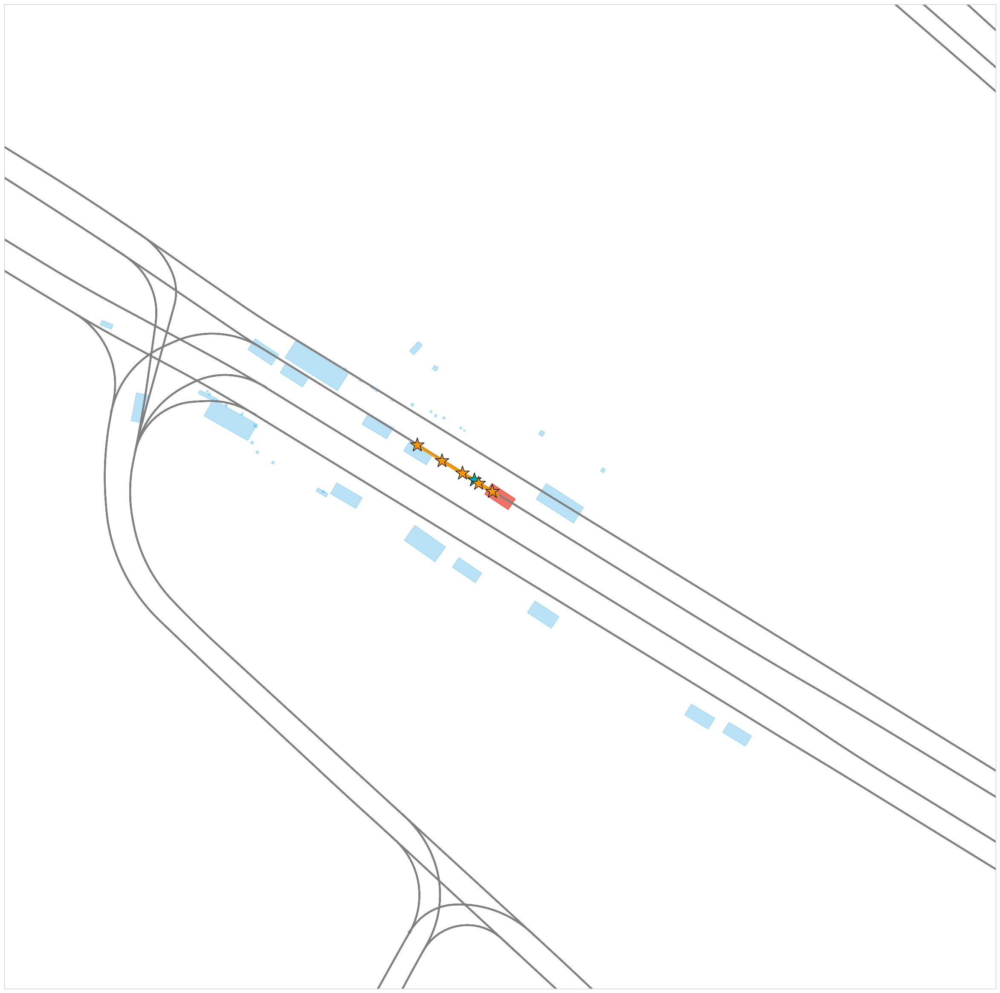

In [65]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort[8]
plot_scene(X[idx], helper, ax)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10)
#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

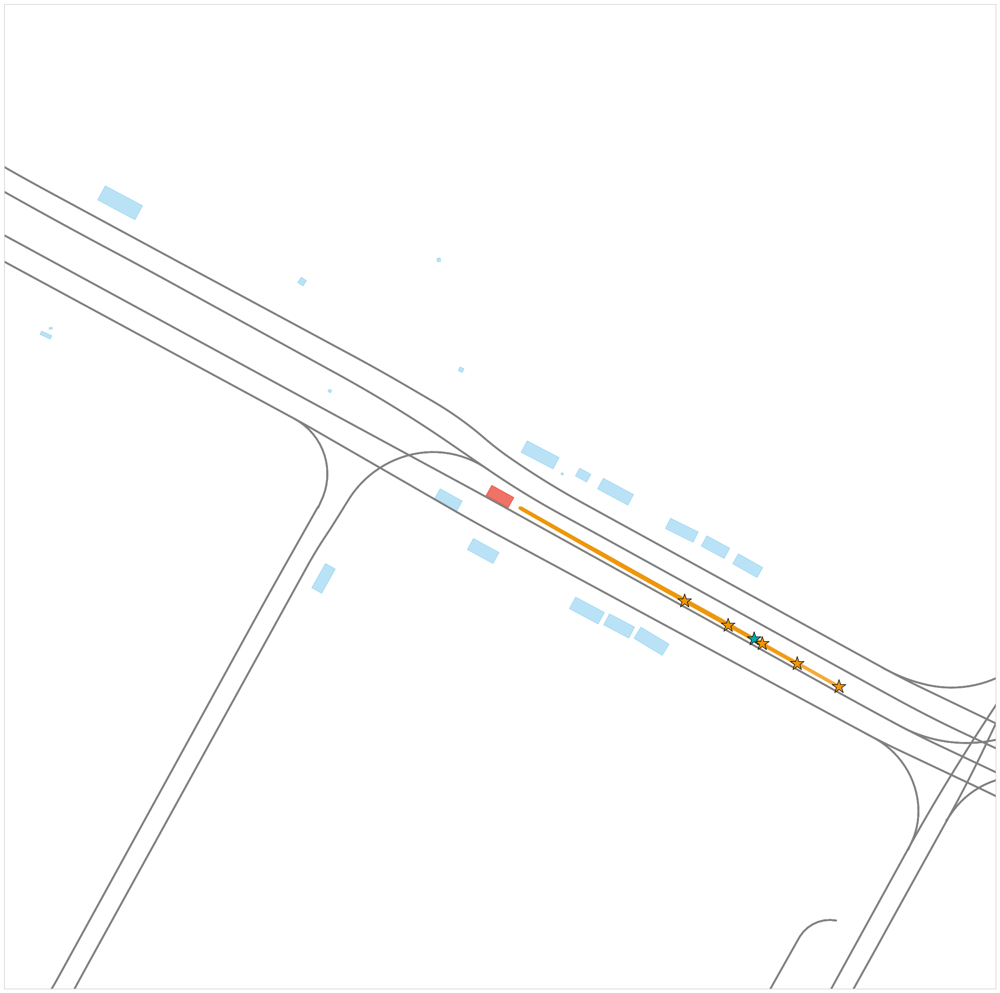

In [74]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort[18]
plot_scene(X[idx], helper, ax)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10)
#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

In [92]:
arg_sort_5 = ade_5.mean(axis=2).min(axis=1).argsort()

([], [])

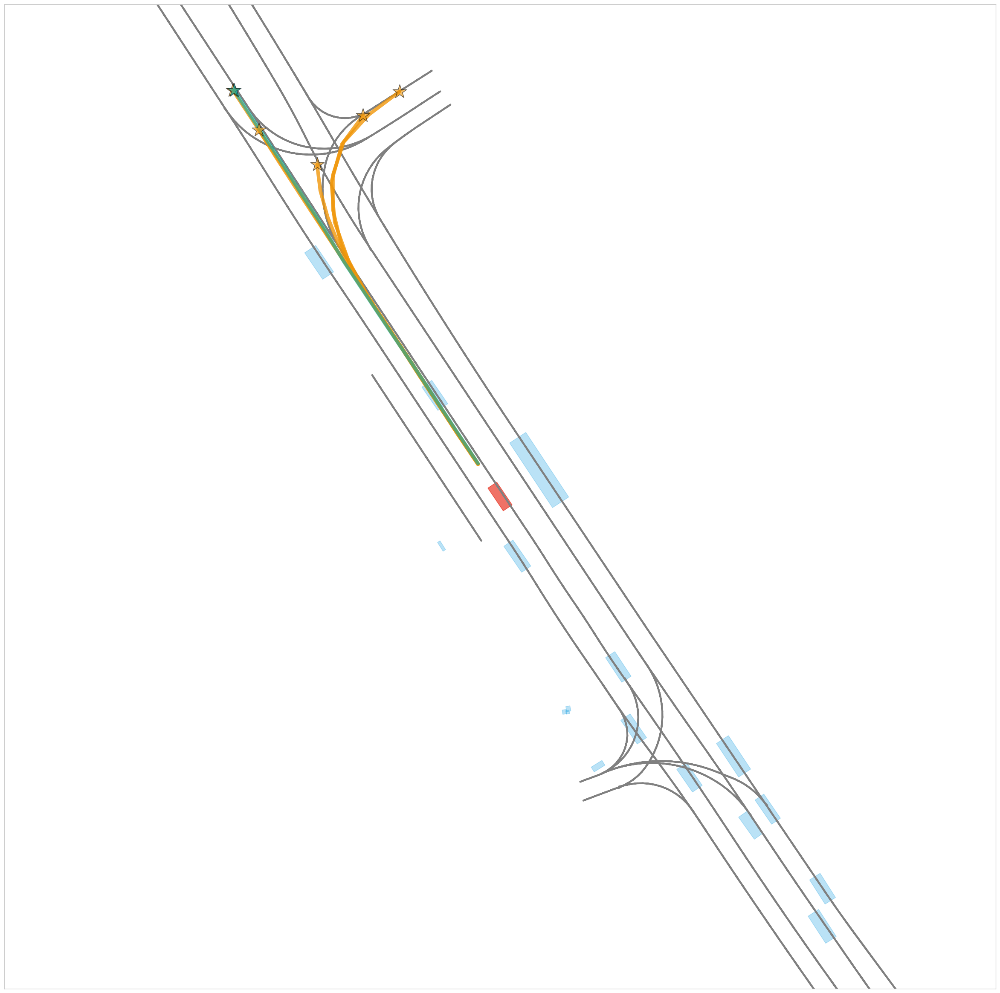

In [104]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[20]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

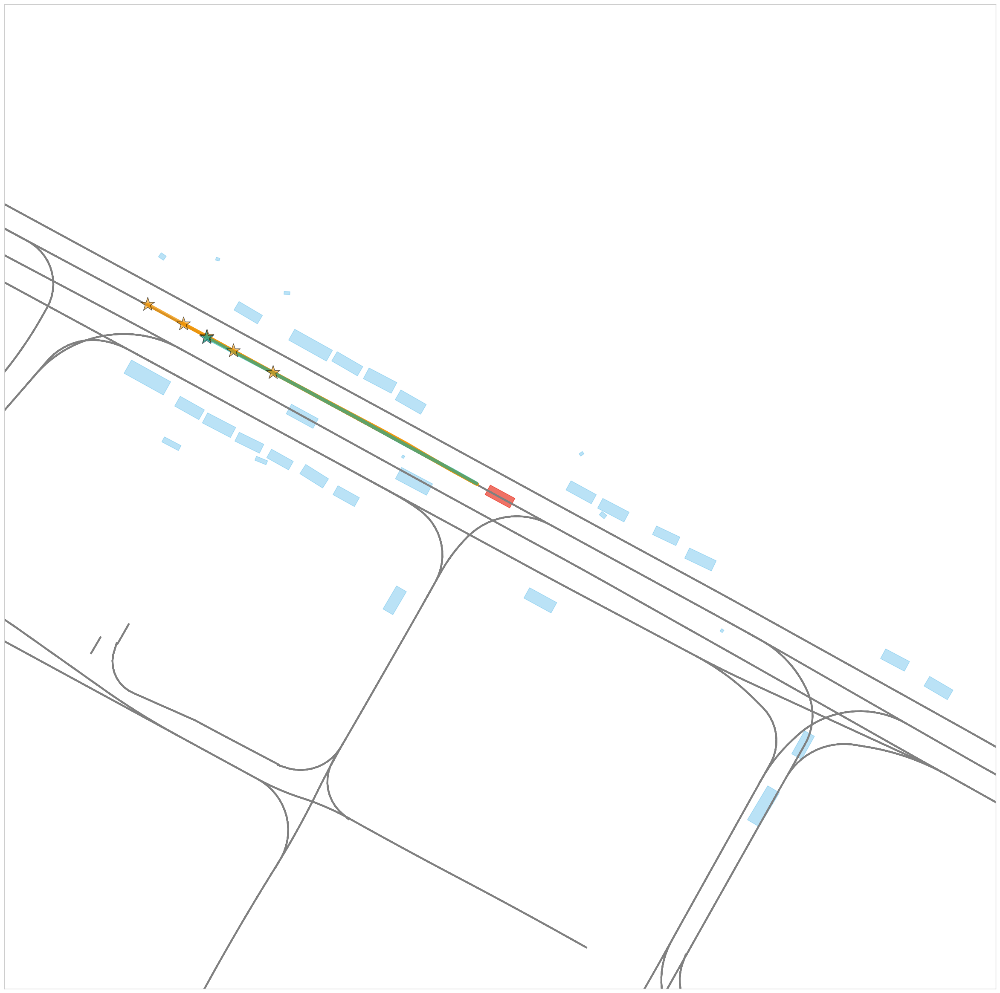

In [105]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[21]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

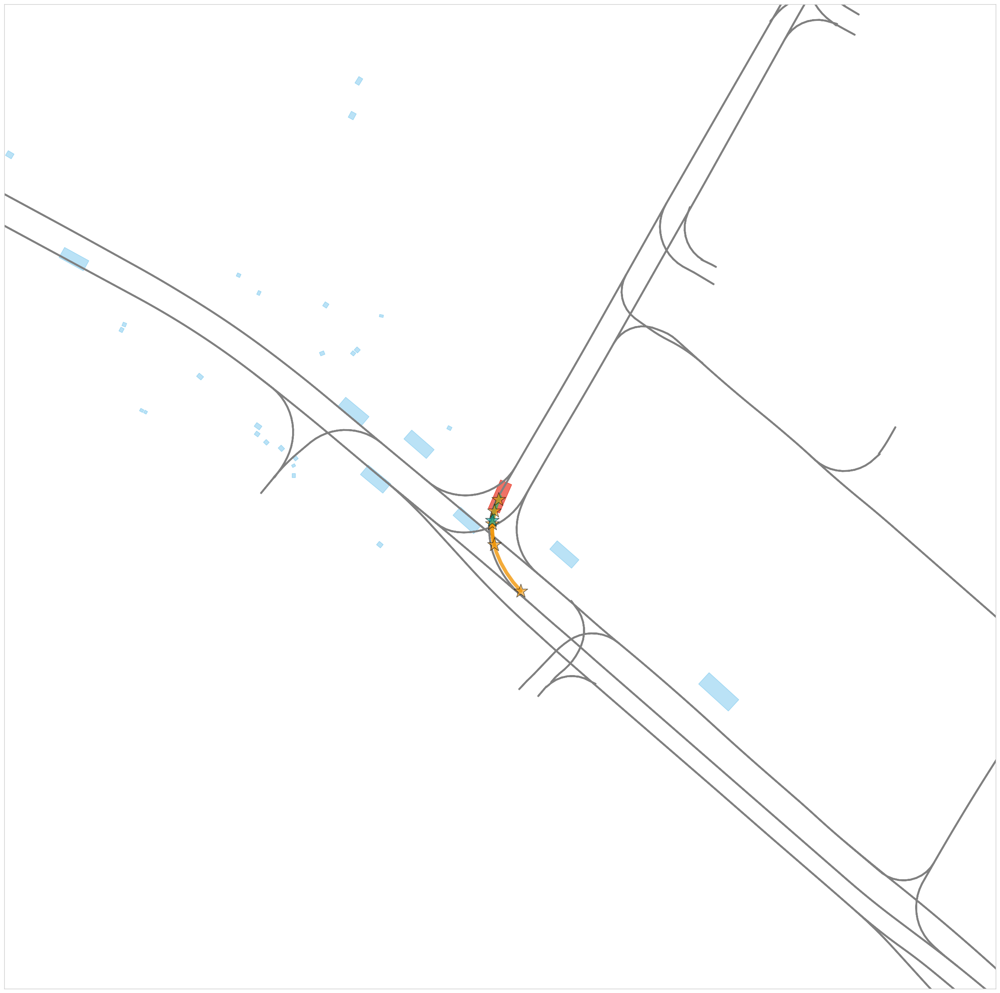

In [110]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[26]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

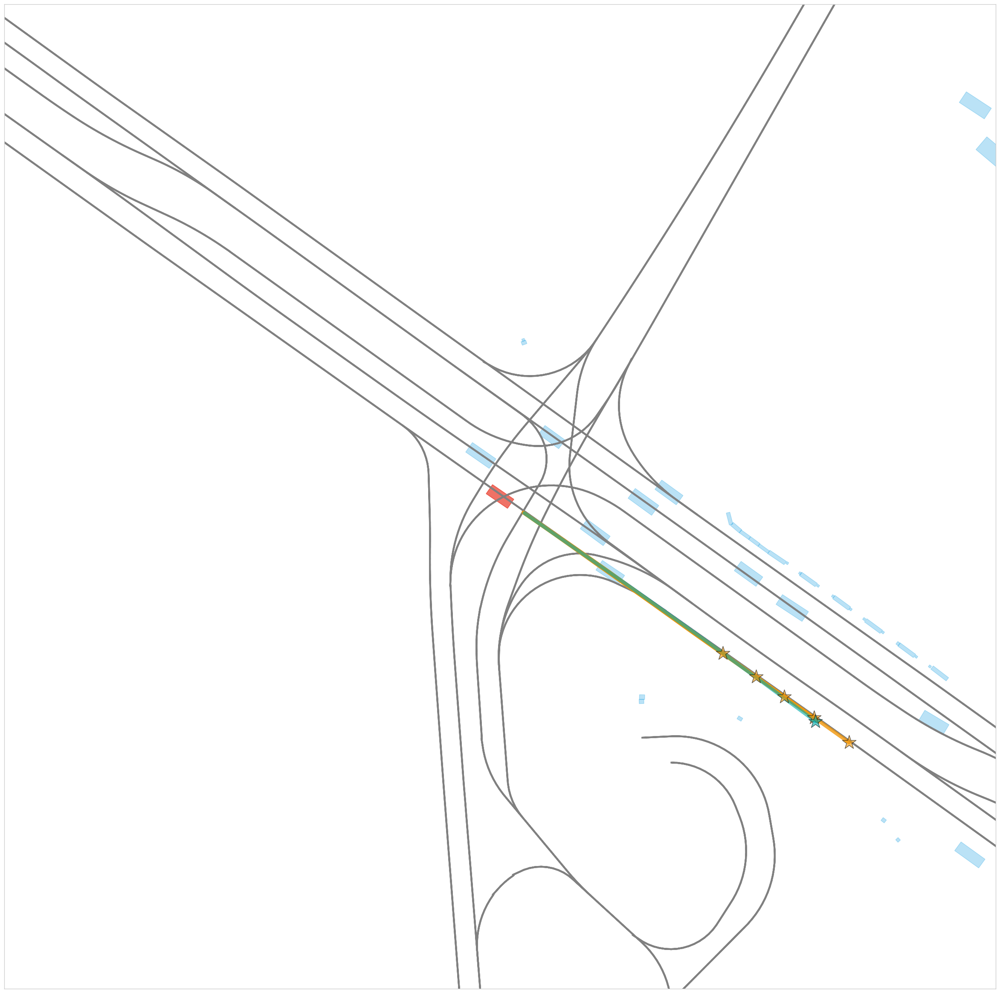

In [113]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[29]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

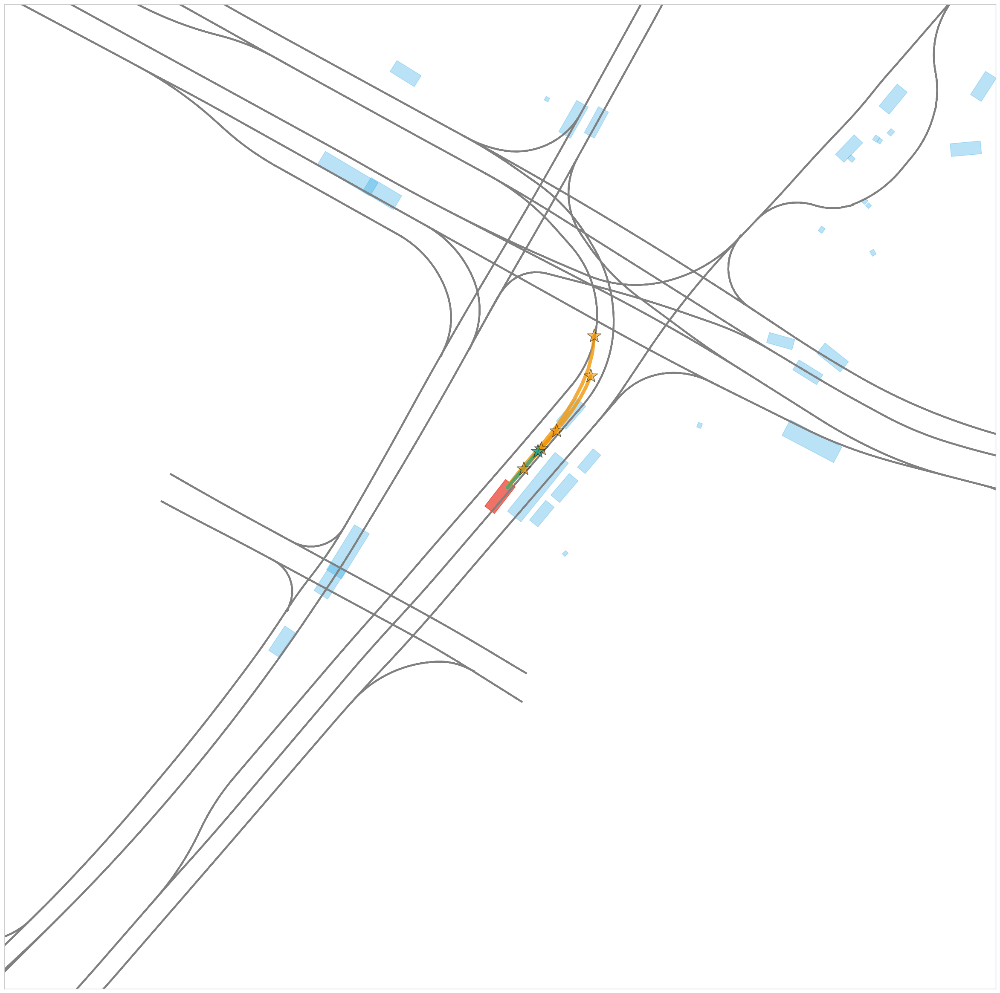

In [119]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[35]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

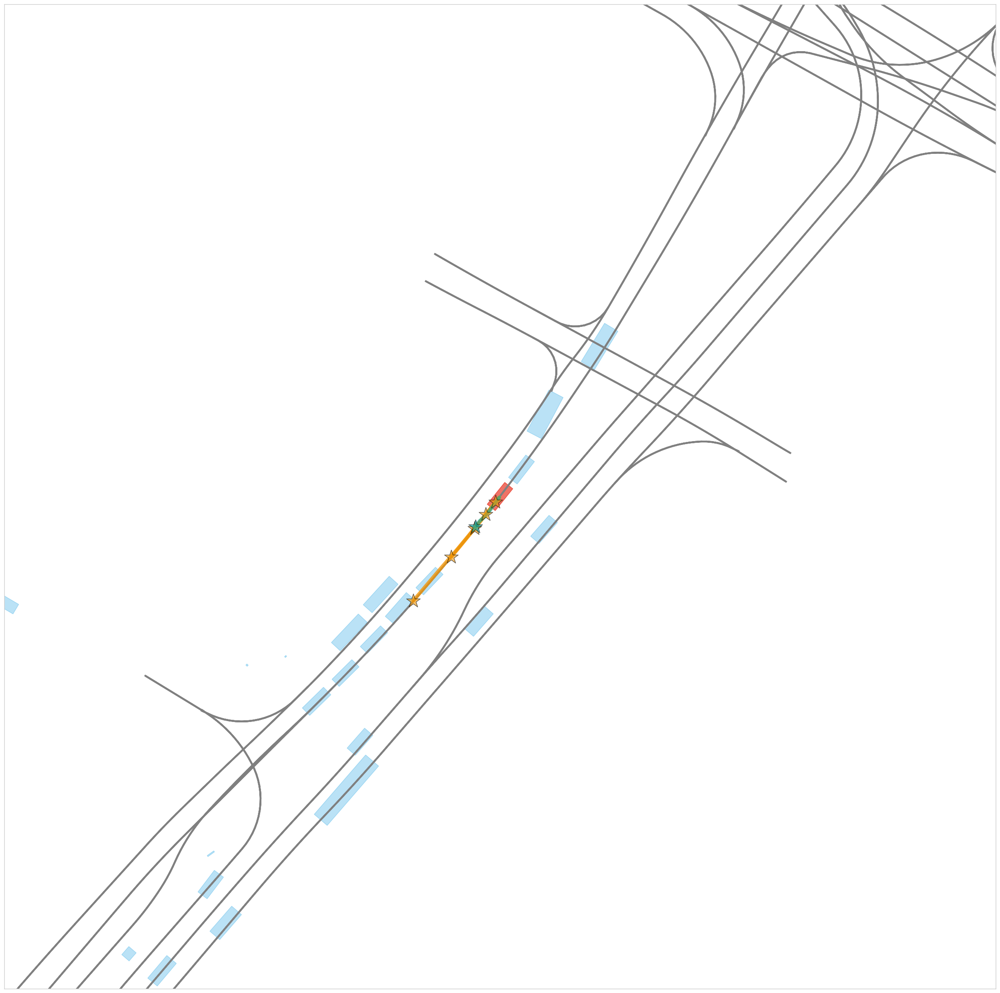

In [120]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[36]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

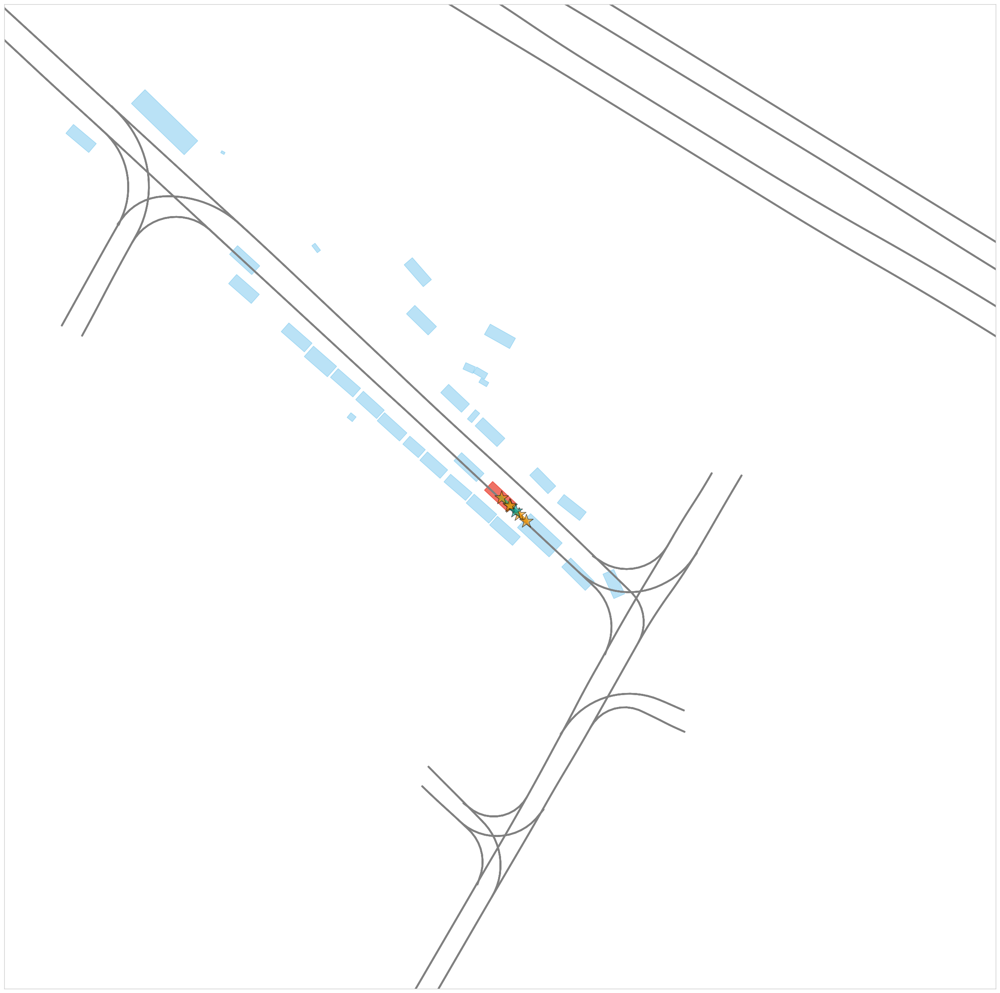

In [128]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[44]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

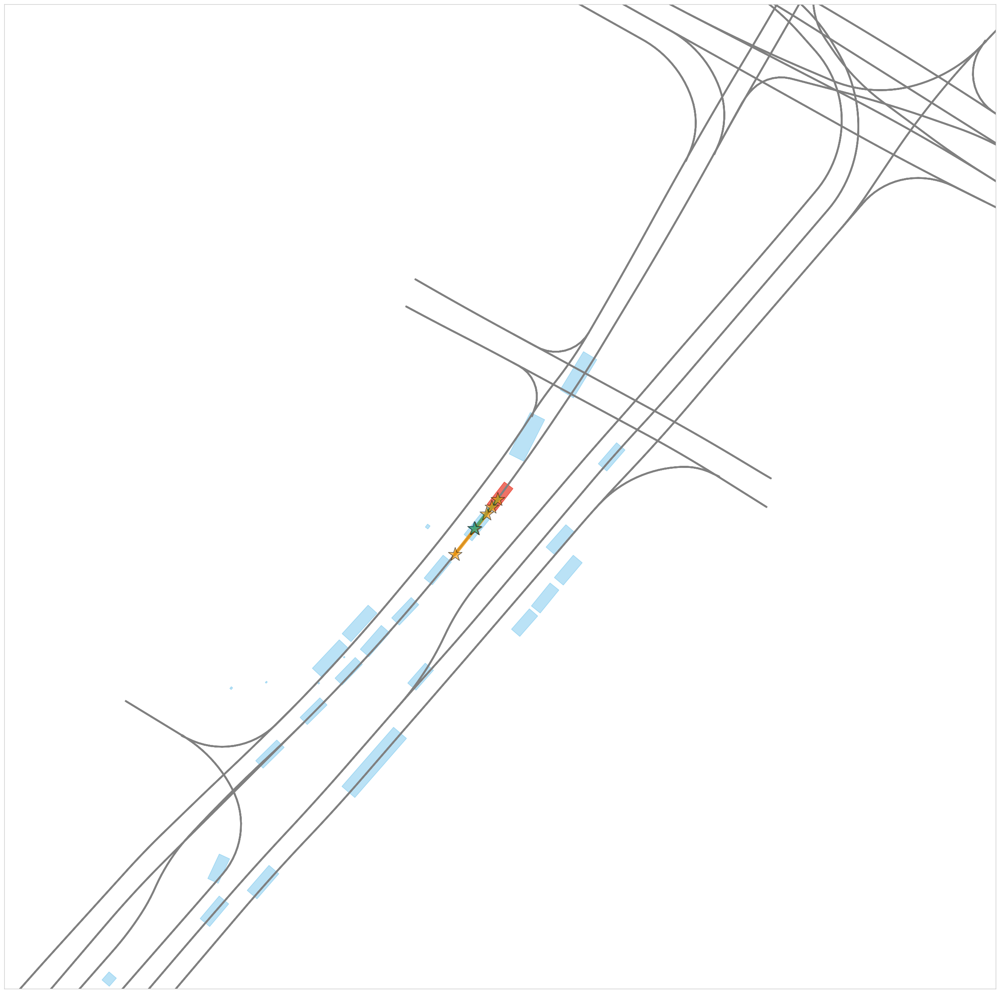

In [133]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[50]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

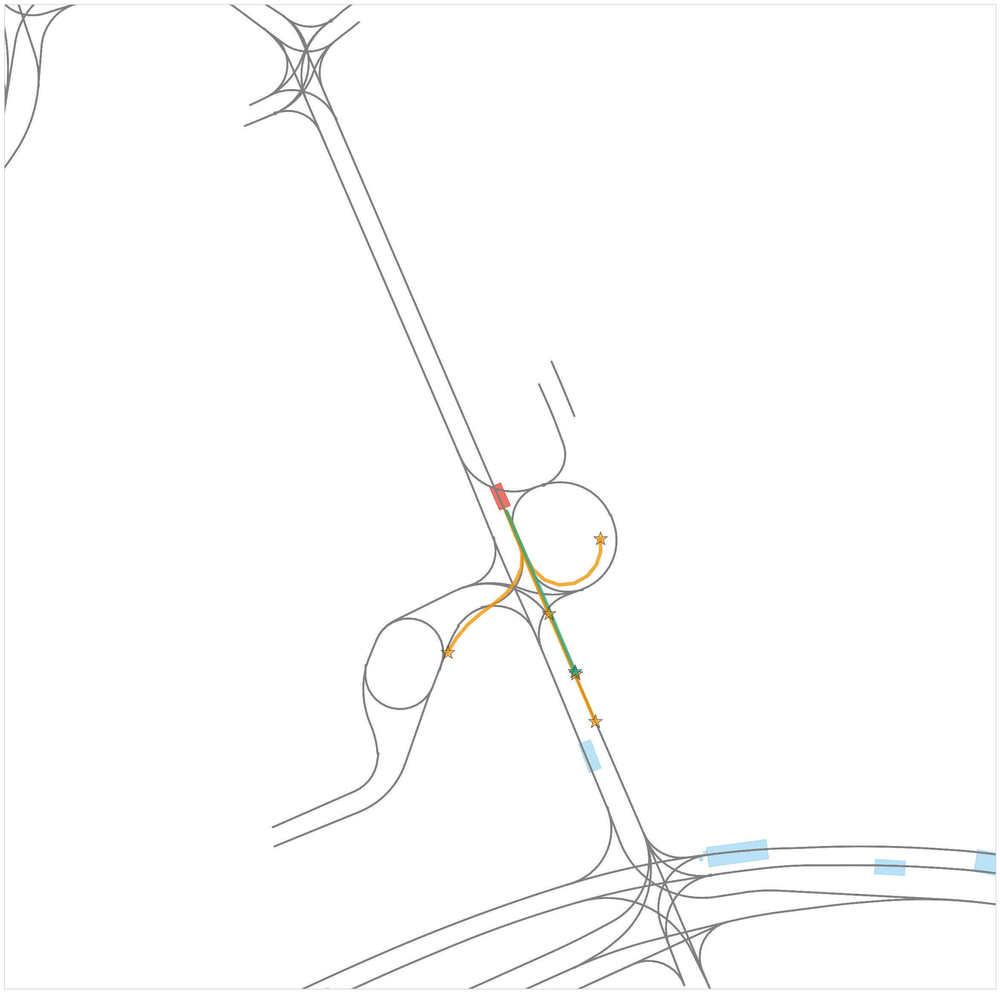

In [134]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[50]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

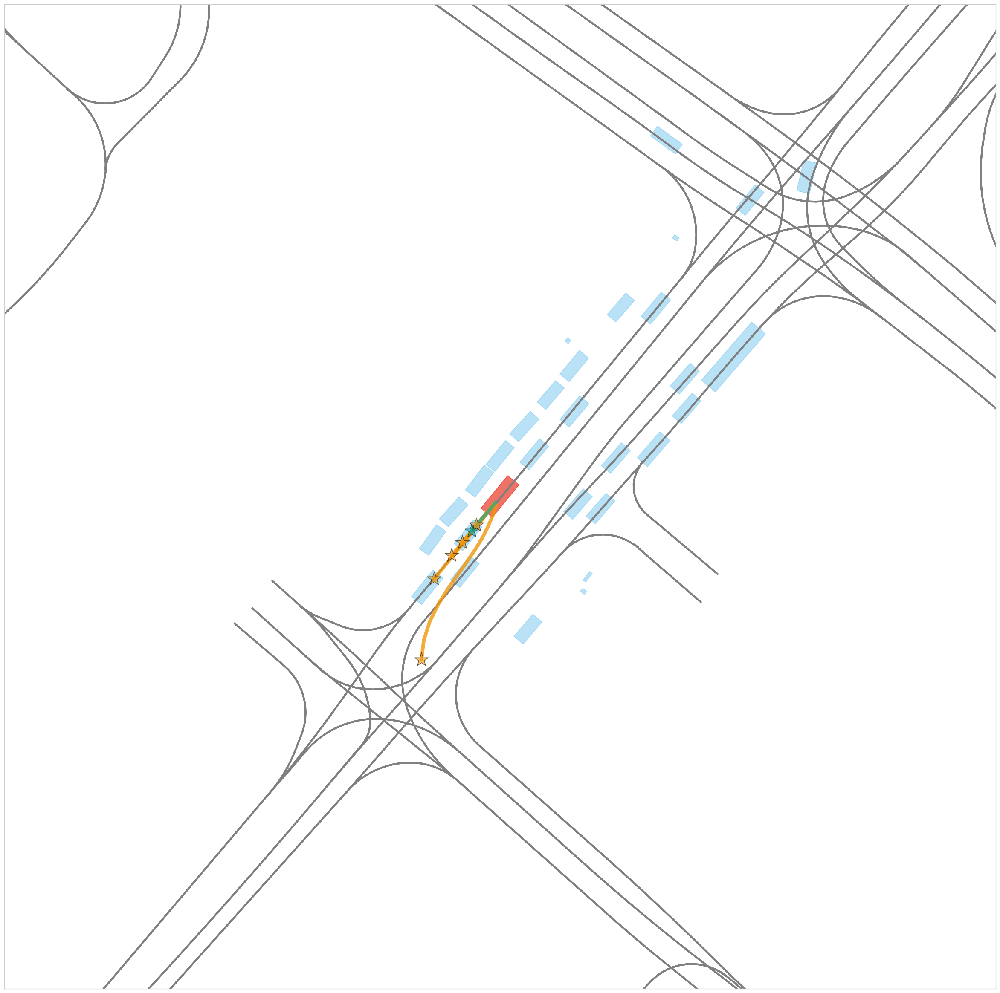

In [136]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[52]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

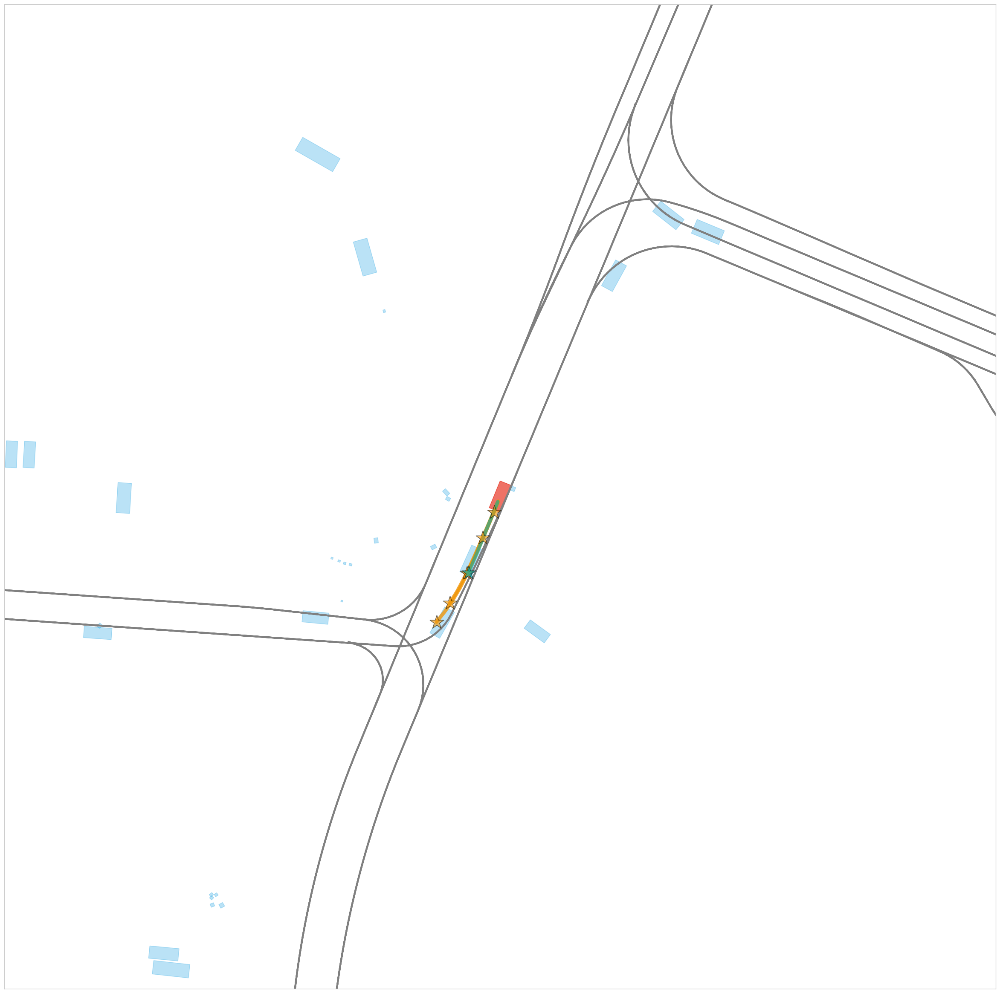

In [141]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[57]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

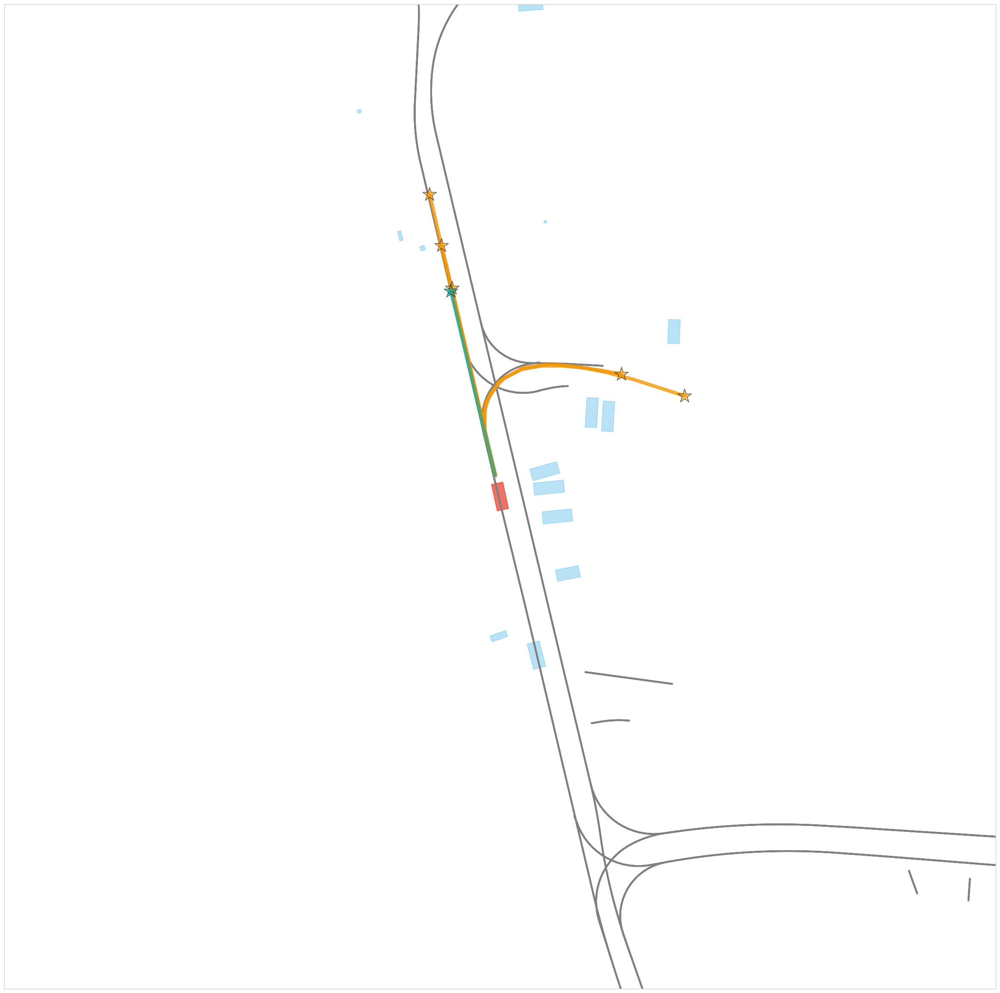

In [142]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[58]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

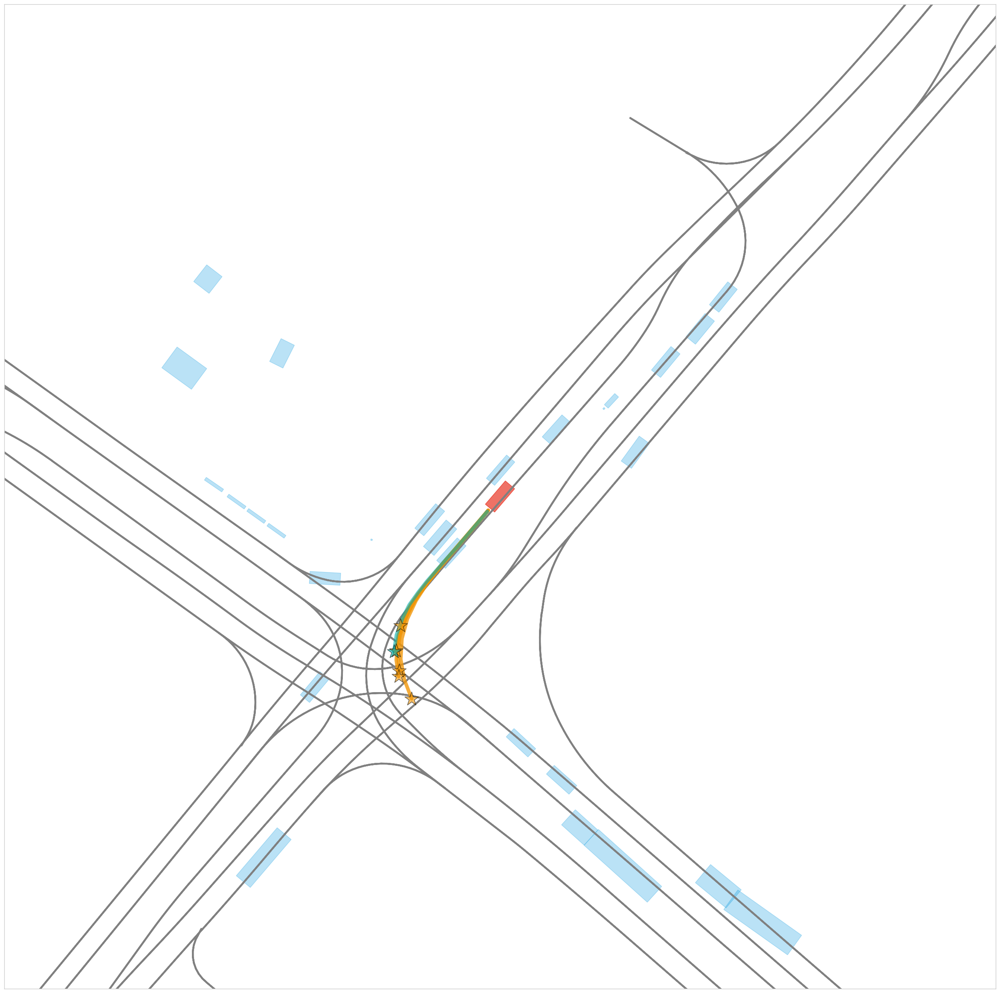

In [150]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[66]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

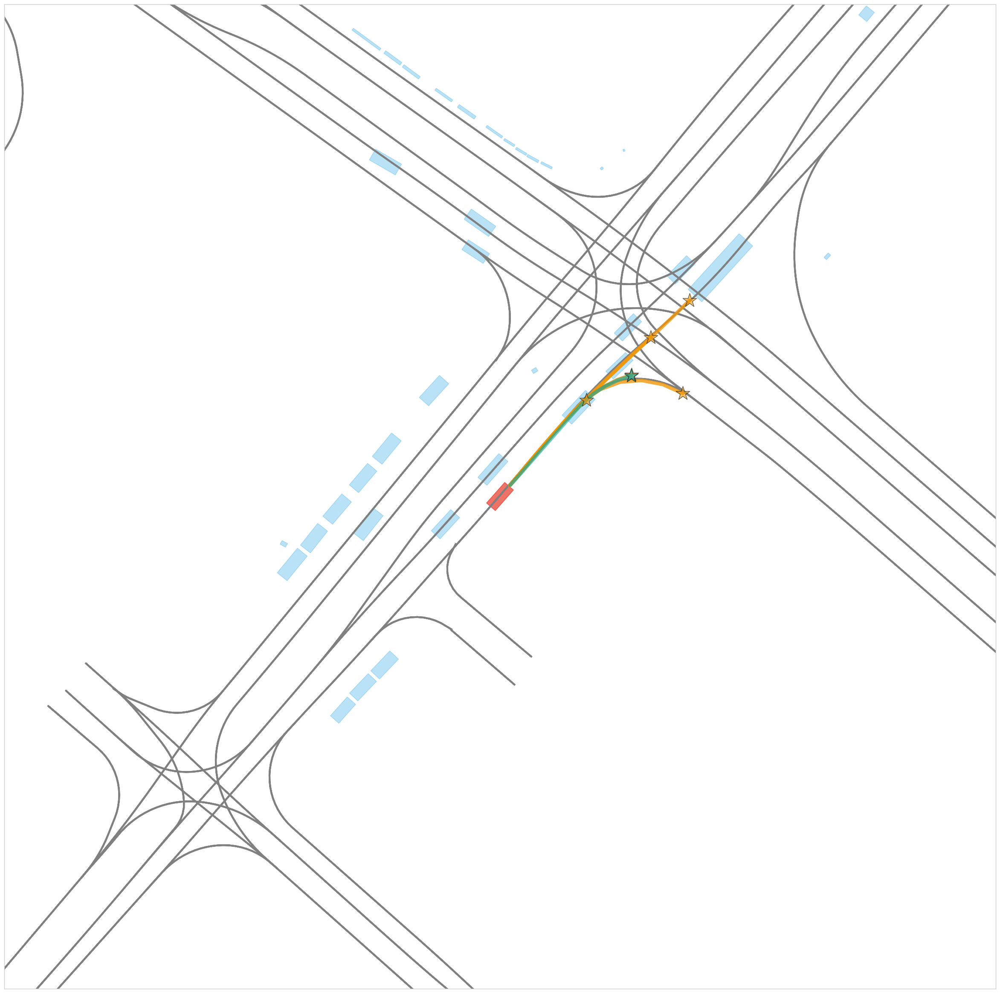

In [154]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[70]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

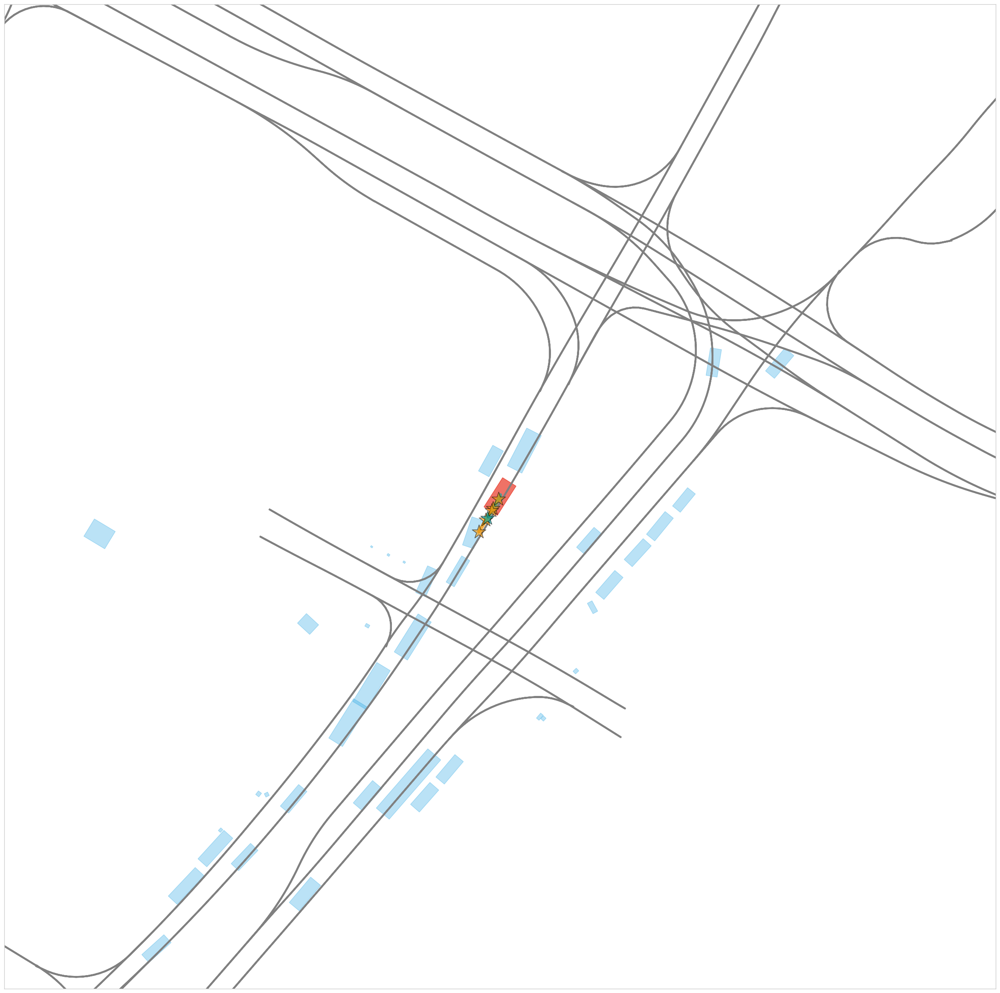

In [155]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[71]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

([], [])

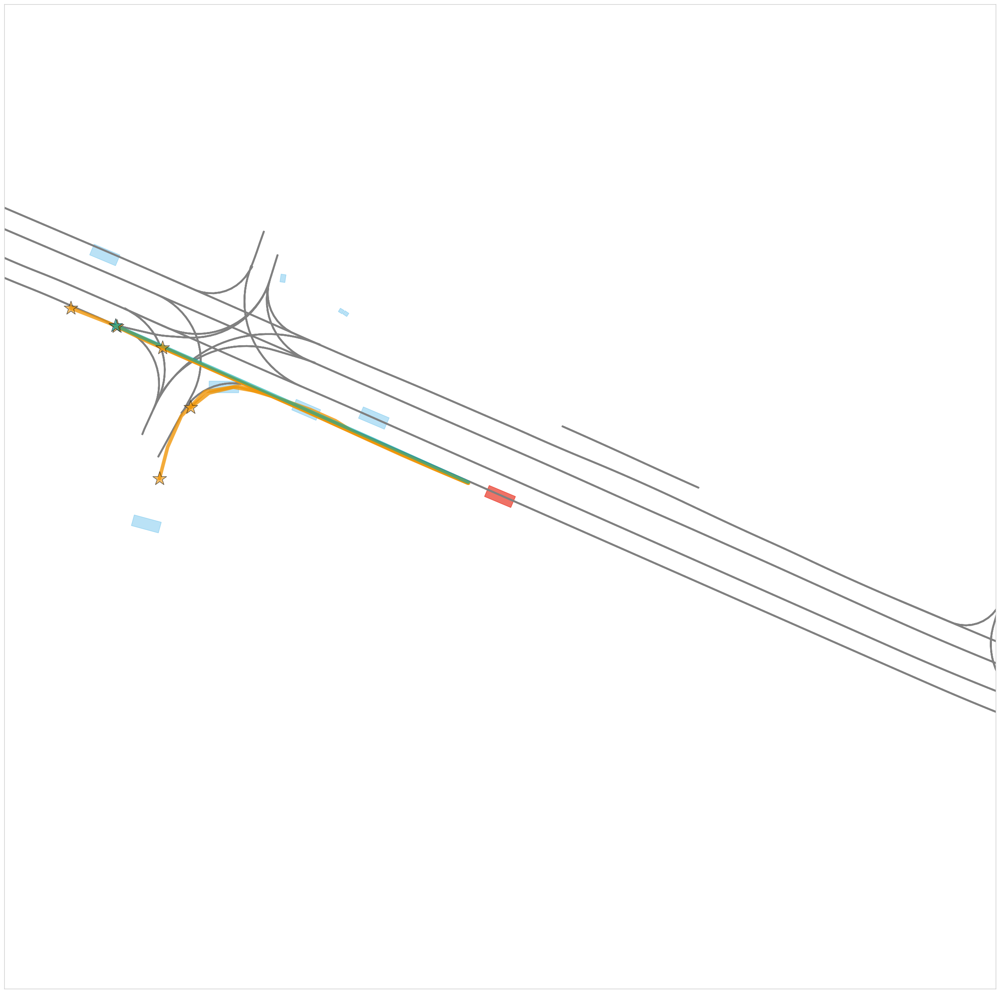

In [168]:
figsize(30,30)
fig, ax = plt.subplots()
idx = arg_sort_5[151]
plot_scene(X[idx], helper, ax)


#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
temp_x = ans_x[idx]
temp_y = ans_y[idx]
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

In [176]:
figsize(30,30)
idx = arg_sort_5[204]
for i in range(83,500):
    fig, ax = plt.subplots()
    idx = arg_sort_5[i]
    plot_scene(X[idx], helper, ax)


    #ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
    temp_x = ans_x[idx]
    temp_y = ans_y[idx]
    agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

    for i in range(len(agent_x)):
        ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
        ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10, alpha=0.6)
    ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10, alpha = 0.6)
    ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, alpha=0.6)
    width = X[idx]['size'][1] * 2
    height = X[idx]['size'][0]
    # box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
    # ax.add_patch(box)
    plt.xticks([])
    plt.yticks([])
    fig.savefig('./val_3_30_sort/fig_{}_pred_all.png'.format(idx))
    plt.close()

([], [])

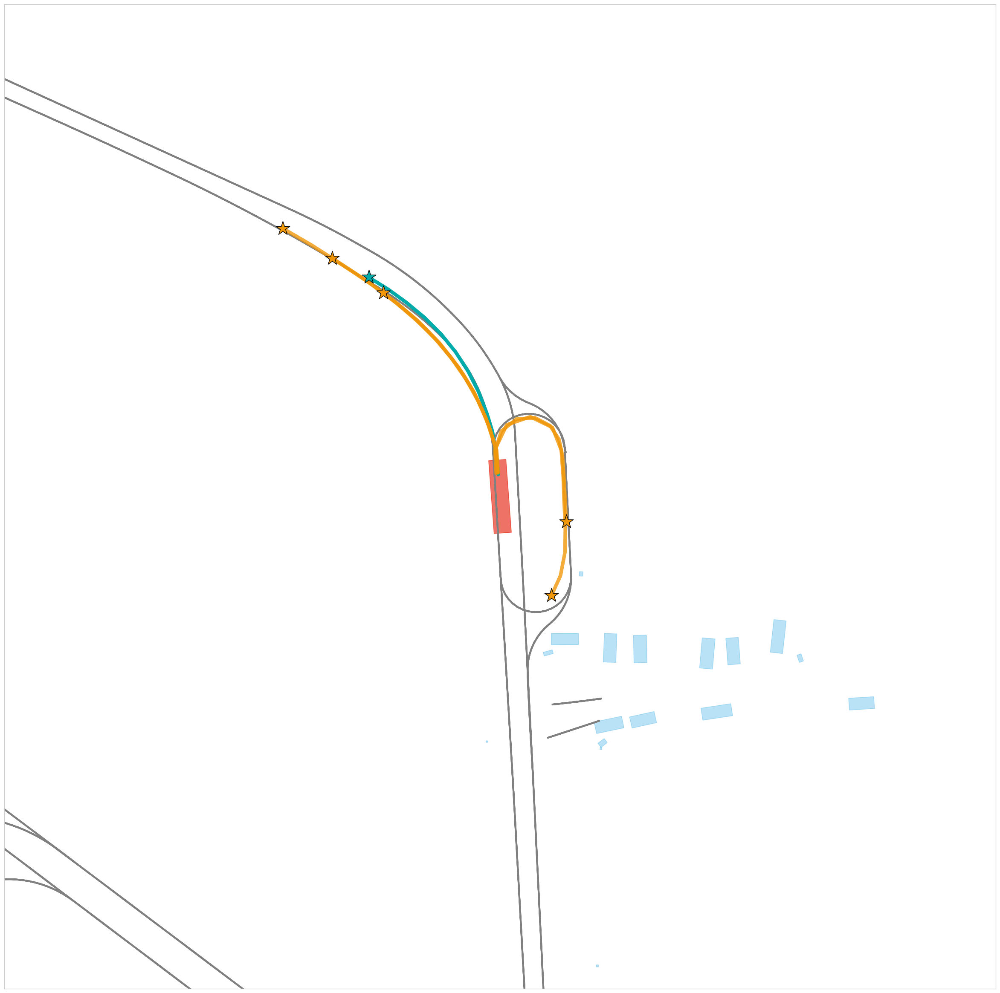

In [45]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 10)
#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
agent_x, agent_y = cluster_trajectories(5,5,temp_x, temp_y)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
# box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
# ax.add_patch(box)
plt.xticks([])
plt.yticks([])
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

In [177]:
temp_x = ans_x[907]
temp_y = ans_y[907]
kIndex = 907

([], [])

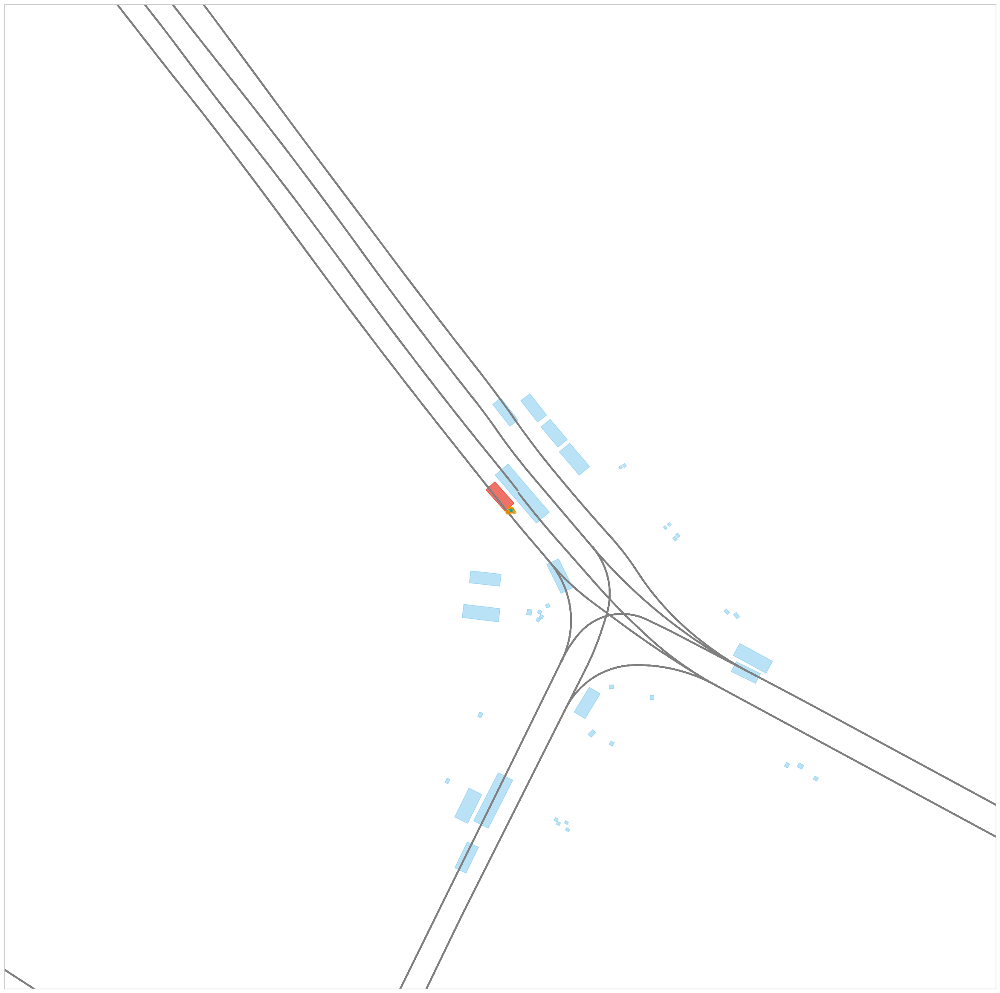

In [182]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 0
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

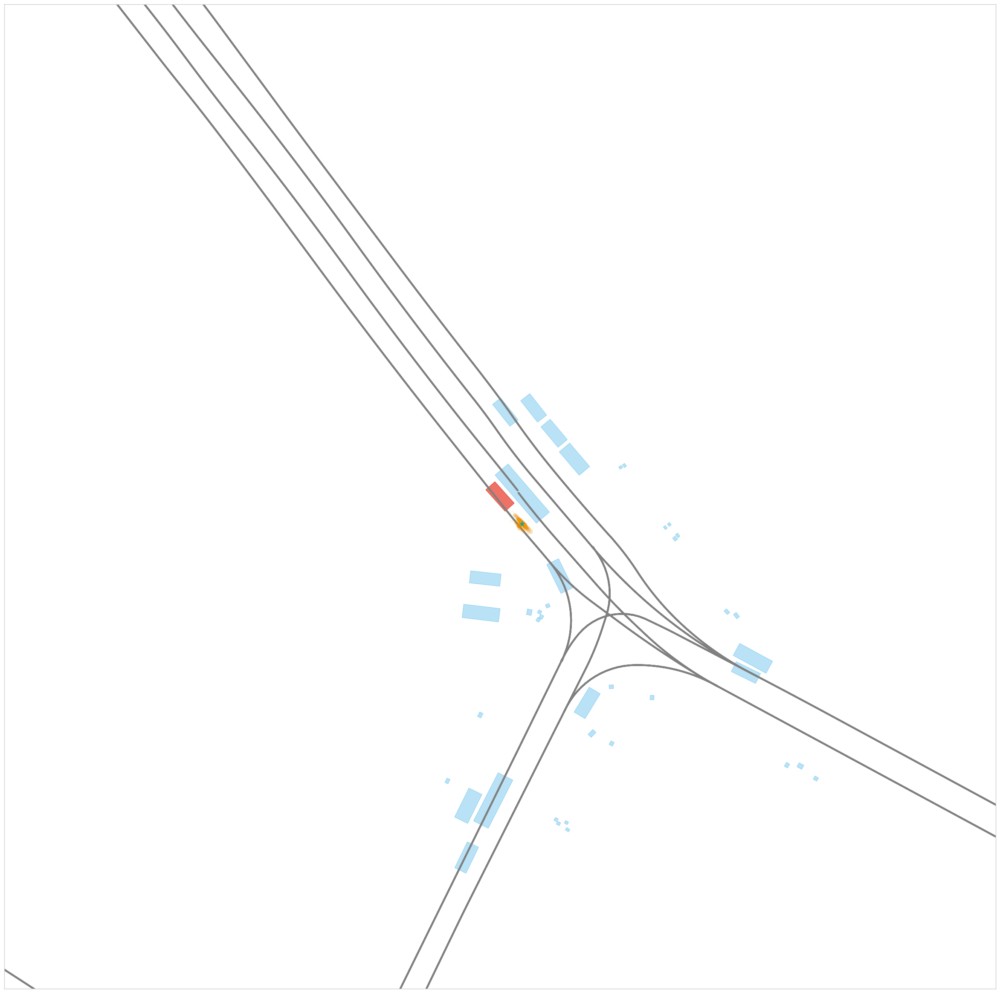

In [183]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 1
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

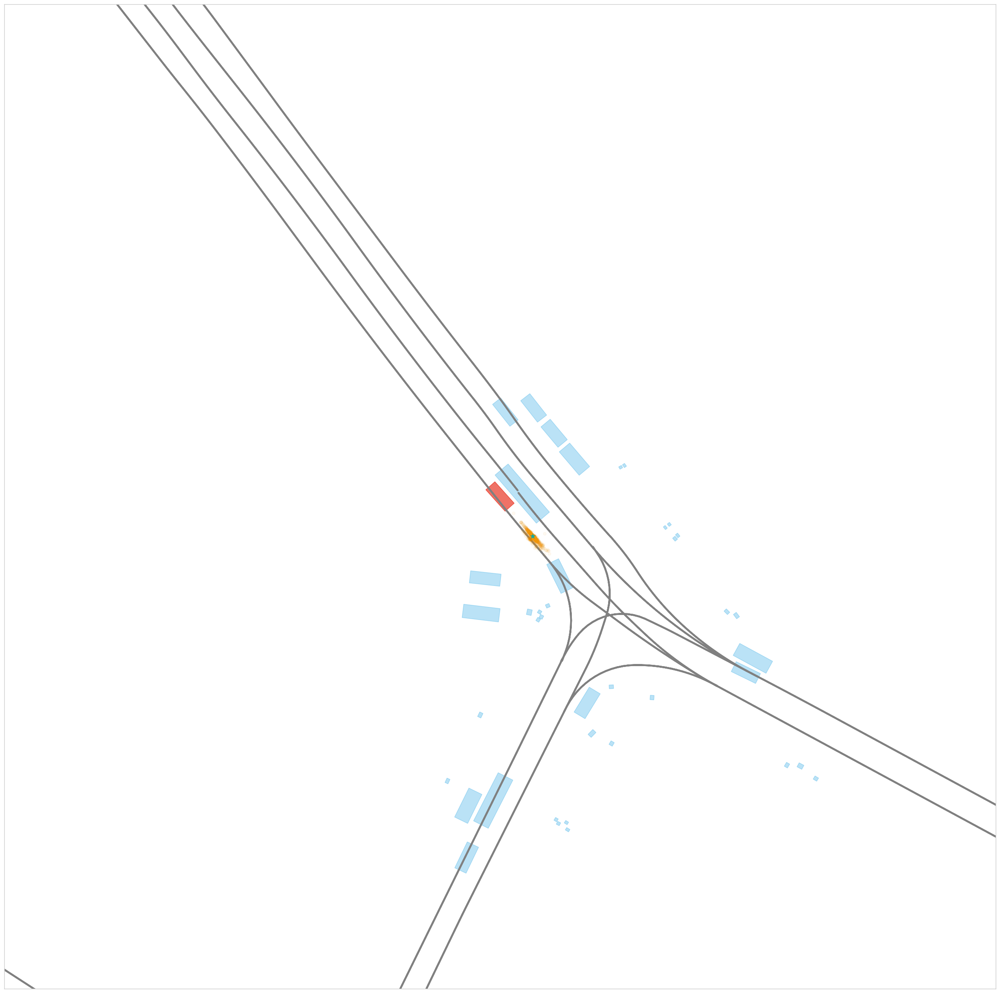

In [184]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 2
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

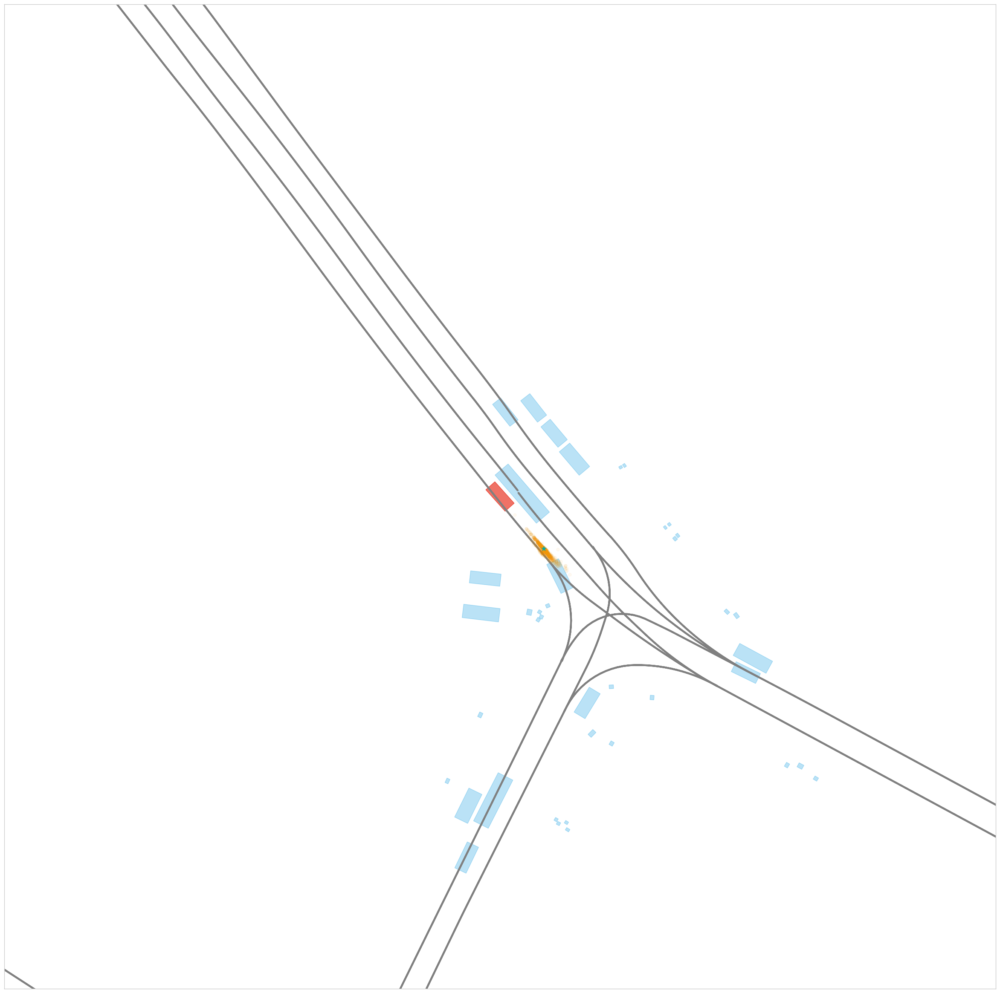

In [185]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 3
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

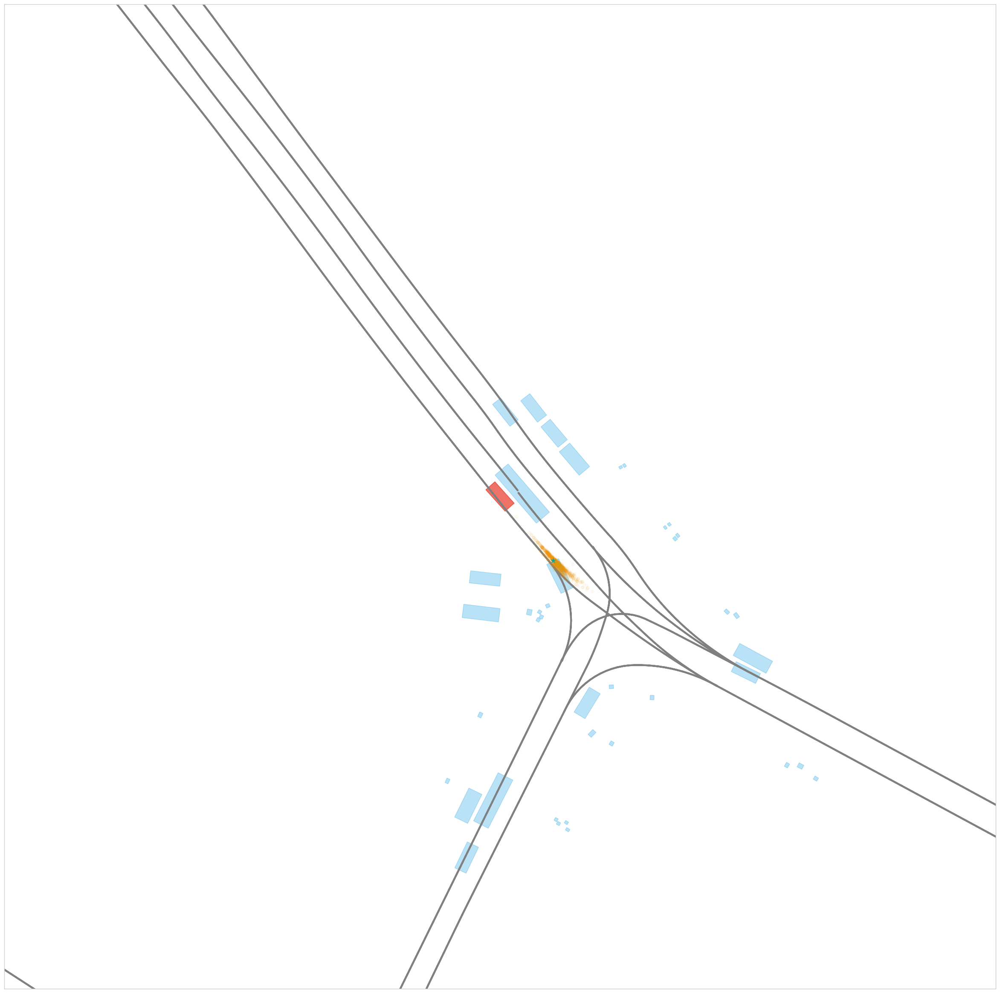

In [186]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 4
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

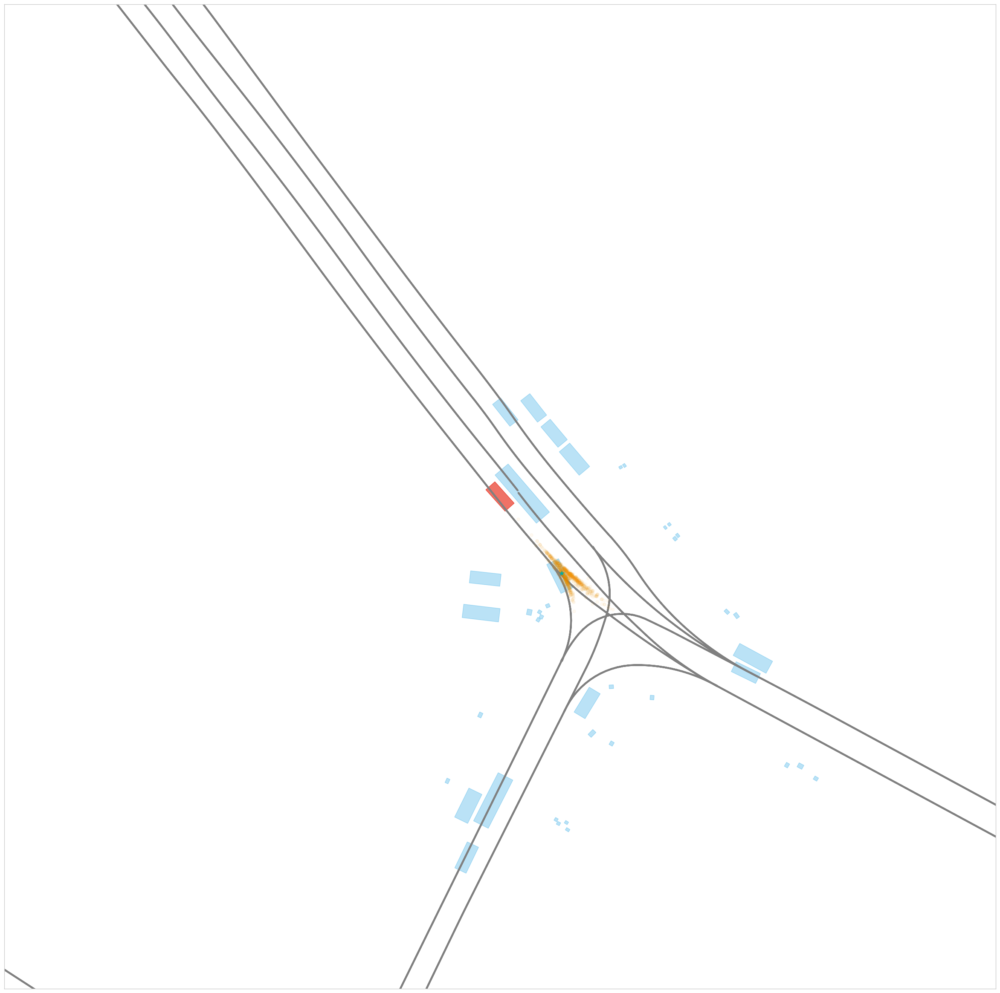

In [187]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 5
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

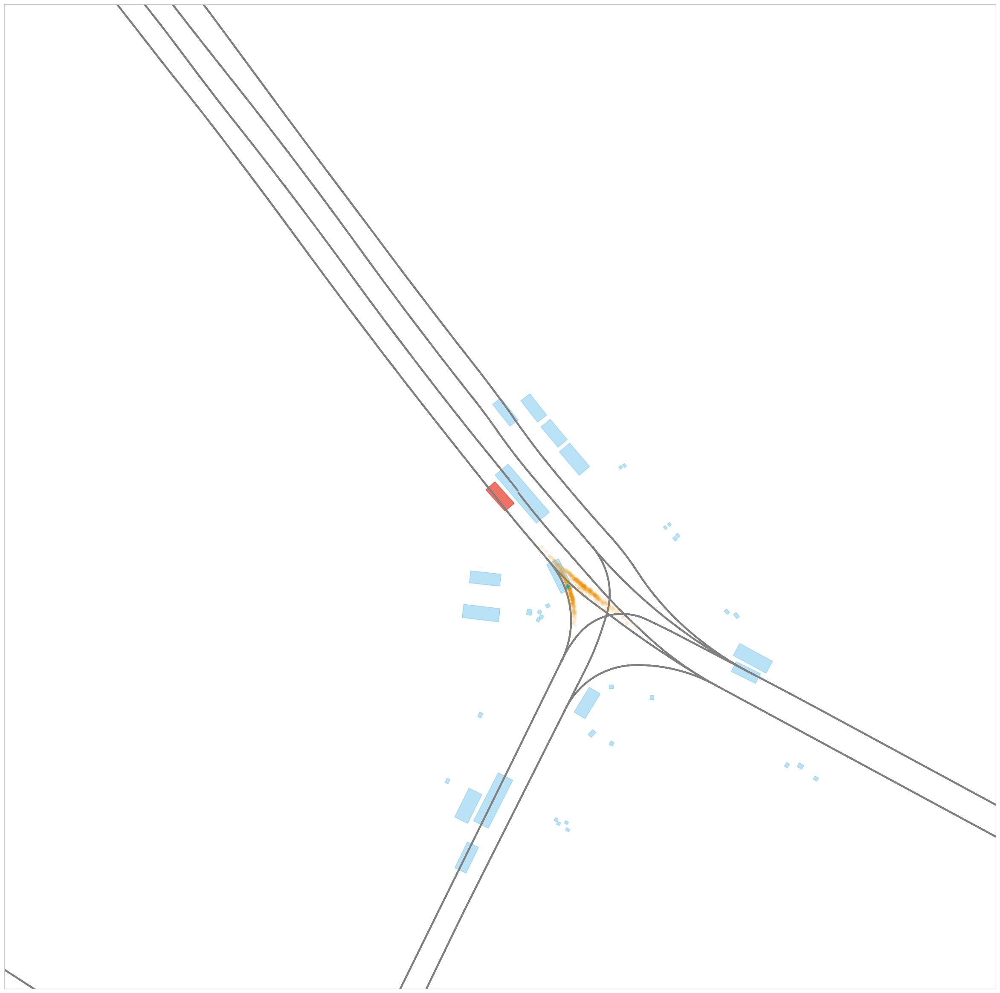

In [188]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 6
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

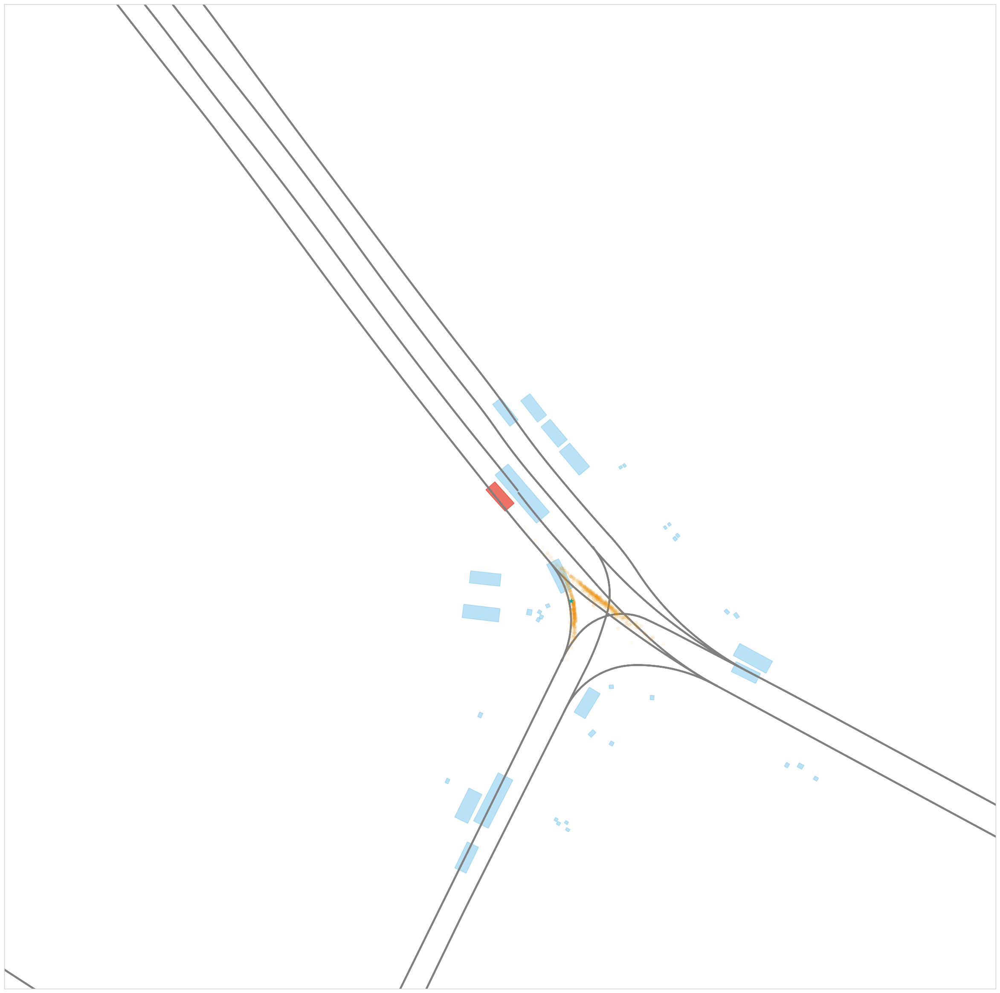

In [189]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 7
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

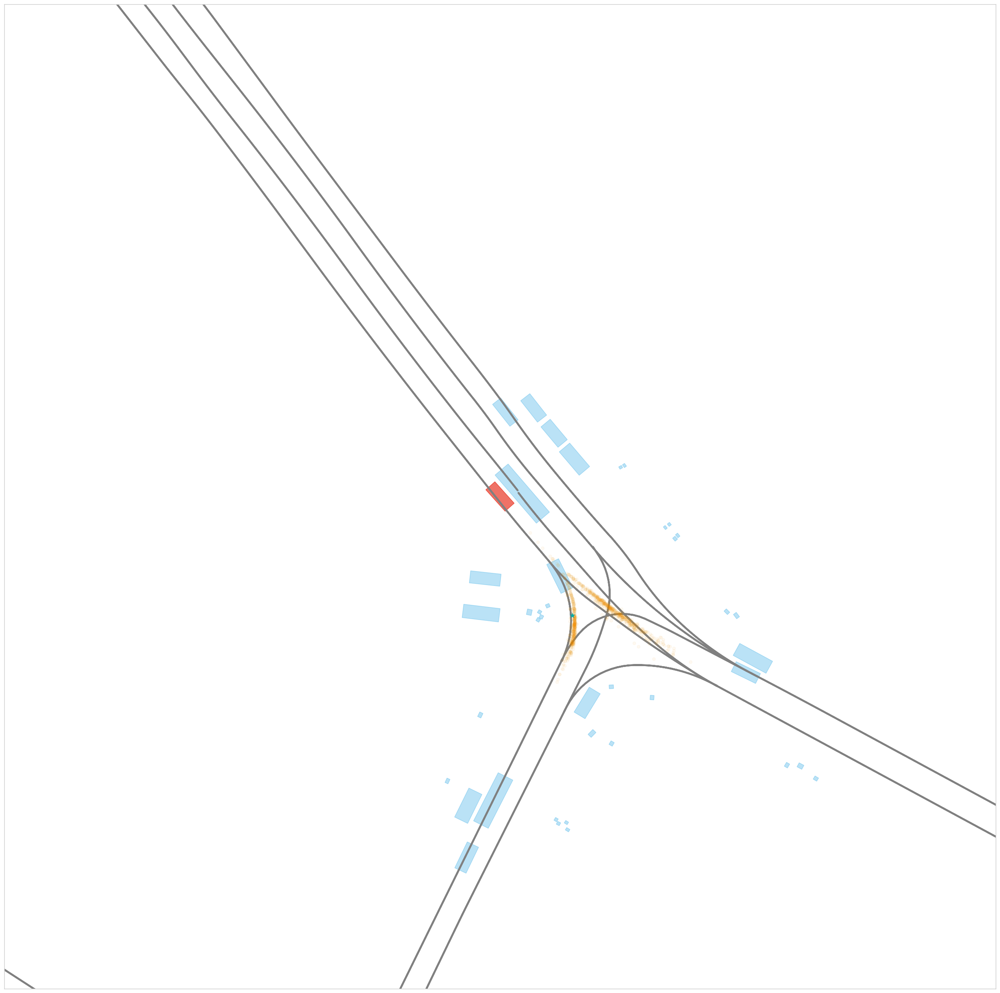

In [190]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 8
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

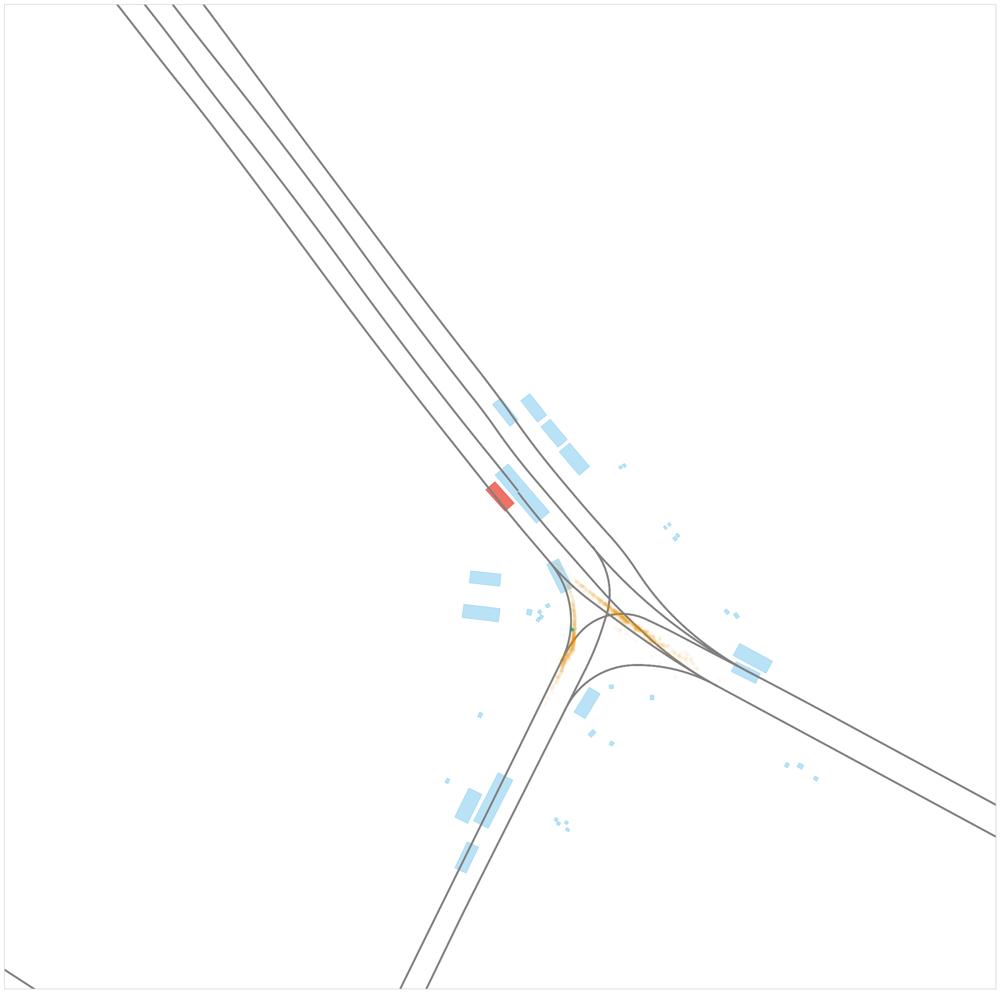

In [191]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 9
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

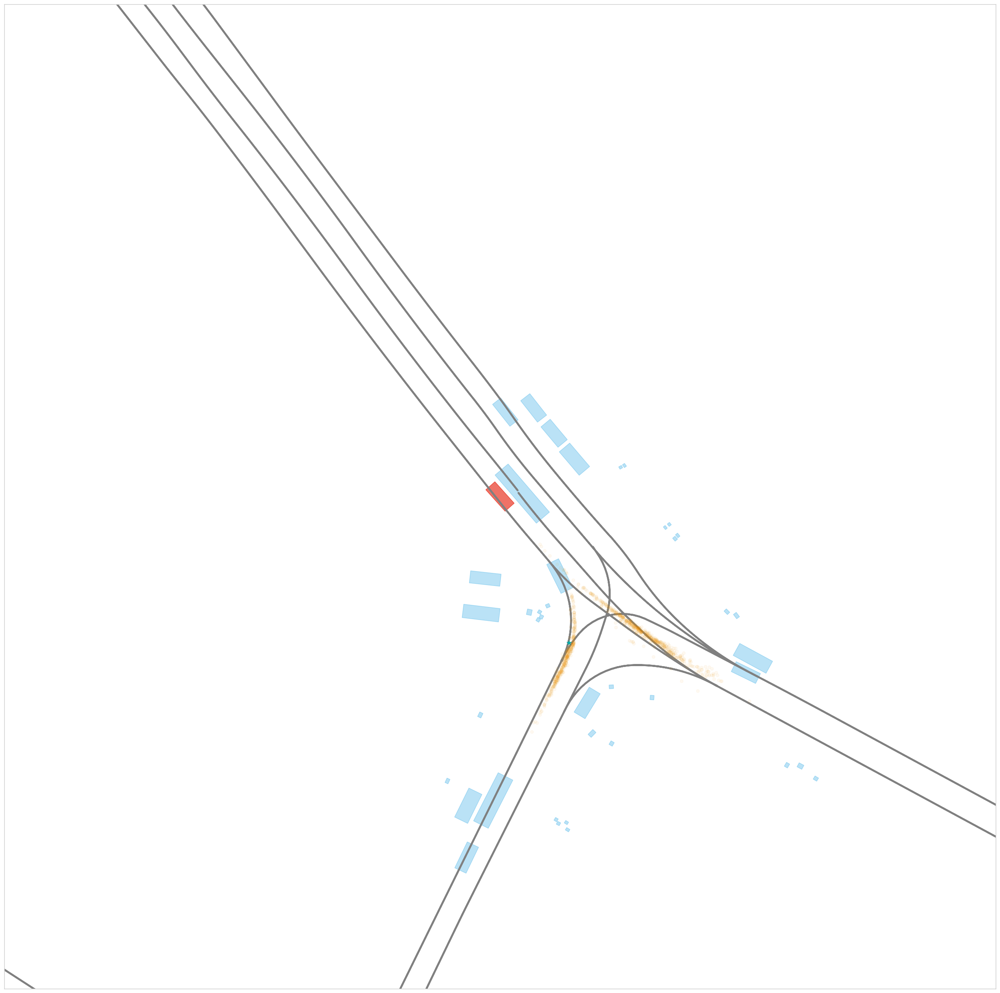

In [192]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 10
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

([], [])

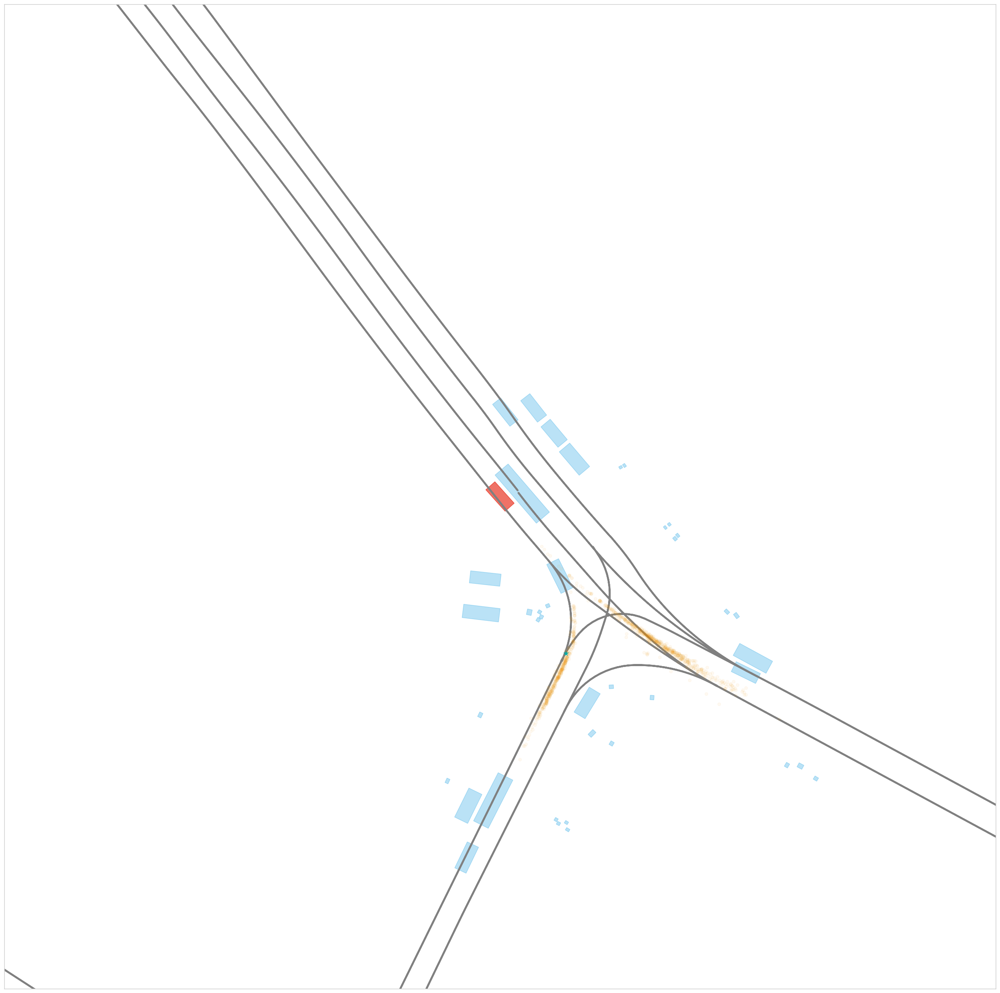

In [193]:
figsize(30,30)
fig, ax = plt.subplots()
idx = kIndex
plot_scene(X[idx], helper, ax)
time_step = 11
# ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6)

#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)

# ax.plot(temp_x[:,0], temp_y[:,0], color = '#F09609', alpha = 0.8, linewidth = 6)
ax.scatter(temp_x[:,time_step], temp_y[:,time_step], marker='.', s = 100, color = '#F09609', alpha = 0.05, zorder = 10)
ax.scatter(gt_x[idx][time_step], gt_y[idx][time_step], marker='*', s = 100, color = '#00ABA9', linewidths = 0.01,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
plt.xticks([])
plt.yticks([])

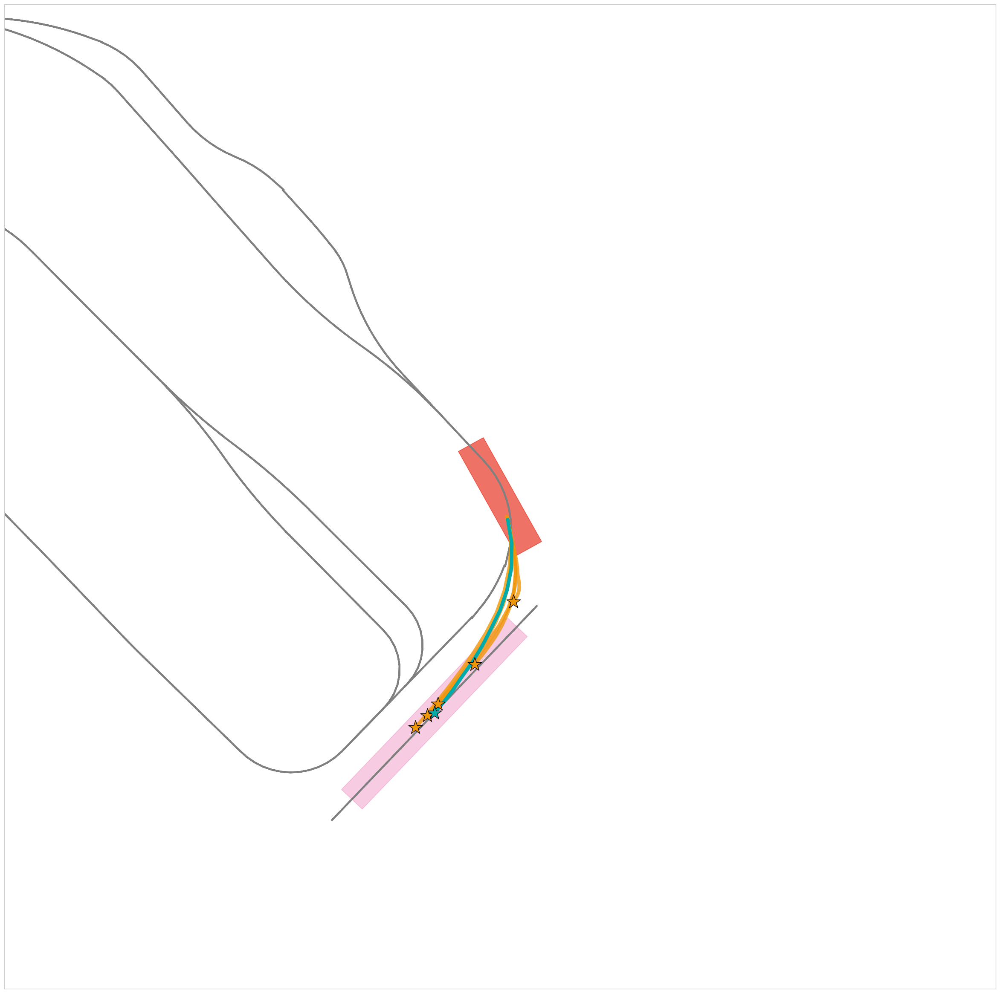

In [283]:
figsize(30,30)
fig, ax = plt.subplots()
idx = 50 #index = 50 mini_val
plot_scene(X[idx], helper, ax)
ax.plot(gt_x[idx], gt_y[idx], color = '#00ABA9', linewidth = 6, zorder = 5)
ax.scatter(gt_x[idx][-1], gt_y[idx][-1], marker='*', s = 600, color = '#00ABA9', linewidths = 1,edgecolors = 'black', zorder = 11)
#ax.scatter(temp_x, temp_y, s= 1, alpha=0.5)
agent_x, agent_y = cluster_trajectories(5,5,temp_x_2, temp_y_2)

for i in range(len(agent_x)):
    ax.plot(agent_x[i], agent_y[i], color = '#F09609', alpha = 0.8, linewidth = 6)
    ax.scatter(agent_x[i][-1], agent_y[i][-1], marker='*', s = 600, color = '#F09609', linewidths = 1,edgecolors = 'black', zorder = 10)
width = X[idx]['size'][1] * 2
height = X[idx]['size'][0]
box = Rectangle(np.array([gt_x[idx][-1] - width / 2,gt_y[idx][-1] - height / 2]),width, height, angle = dir / np.pi * 180, rotation_point = 'center', color = '#D80073', alpha = 0.2)
ax.add_patch(box)
plt.xticks([])
plt.yticks([])
plot_lane(lane_nodes, None, ax)
#fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
#plt.close()

In [264]:
t = np.linspace(0,1,101).reshape(-1,1)
s = 1 - t
t_2 = t ** 2
s_2 = s ** 2
t_1_s_1 = t * s
def generate_bezier_2(xy, v, yaw, node):
    #offset = max(5, v)
    offset = np.sqrt(((xy - node.coors) ** 2).sum()) * 0.45
    offset = max(4, offset)
    yaw2 = node.direction
    xy_0 = xy
    xy_1 = xy + offset * np.array([np.cos(yaw), np.sin(yaw)])
    xy_2 = node.coors - offset * np.array([np.cos(yaw2), np.sin(yaw2)])
    xy_3 = node.coors
    ans_xy = s ** 3 * xy_0 + 3 * xy_1 * s_2 * t + 3 * xy_2 * t_2 * s + xy_3 * t ** 3
    return ans_xy[:,0], ans_xy[:,1]

def calc_bezier_2(xy, v, yaw, node): #计算贝塞尔曲线角度和
    x, y = generate_bezier_2(xy, v, yaw, node)
    d_x = x[1:] - x[:-1]
    d_y = y[1:] - y[:-1]
    dis = (d_x ** 2 + d_y ** 2).sum()
    return dis

In [265]:
def calc_candidate_lanes(ann):
    map_name = helper.get_map_name_from_sample_token(ann['sample_token'])
    map = maps[map_name]
    Vertices = Vertices_maps[map_name]
    Vertices_ordered_x = ordered_x_maps[map_name]
    Vertices_ordered_y = ordered_y_maps[map_name]
    temp_xy = np.array([ann['translation'][0], ann['translation'][1]])
    adj_nodes = get_nodes_in_radius(temp_xy[0], temp_xy[1], 20, Vertices, Vertices_ordered_x, Vertices_ordered_y)
    lanes_closest = dict()
    v = helper.get_velocity_for_agent(ann['instance_token'], ann['sample_token'])
    yaw = quaternion_yaw(Quaternion(ann['rotation']))
    for node_idx in adj_nodes:
        node = Vertices[node_idx]
        bezier_dis = calc_bezier_2(temp_xy, v, yaw, node)
        euclidean_dis = np.sqrt(((temp_xy - node.coors) ** 2).sum())
        if node.lane_token in lanes_closest:
            if lanes_closest[node.lane_token][0] > bezier_dis:
                lanes_closest[node.lane_token][0] = bezier_dis
                lanes_closest[node.lane_token][1] = node.lane_idx
            if lanes_closest[node.lane_token][2] > euclidean_dis:
                lanes_closest[node.lane_token][2] = euclidean_dis
                lanes_closest[node.lane_token][3] = node.lane_idx
            
        else:
            lanes_closest[node.lane_token] = [0] * 4
            lanes_closest[node.lane_token][0] = bezier_dis
            lanes_closest[node.lane_token][1] = node.lane_idx
            lanes_closest[node.lane_token][2] = euclidean_dis
            lanes_closest[node.lane_token][3] = node.lane_idx
    return lanes_closest

In [266]:
candidate_lanes = calc_candidate_lanes(X[23])

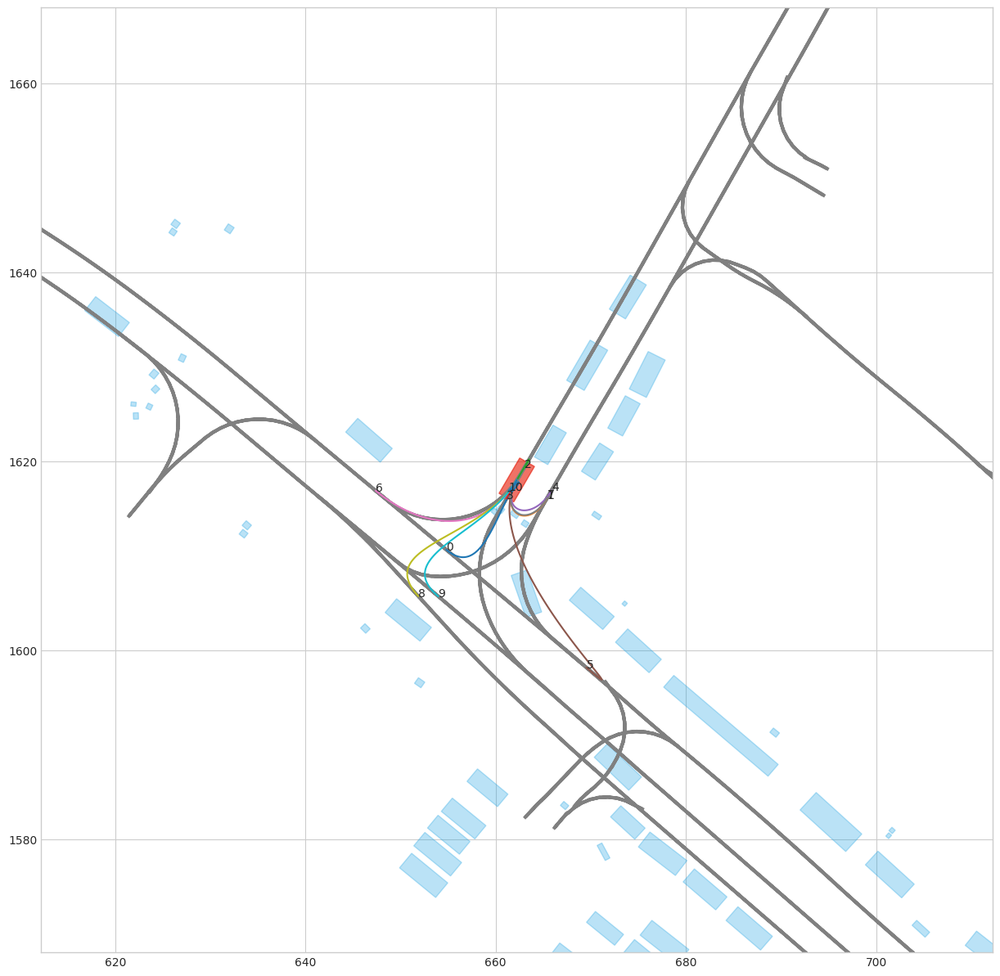

In [267]:
figsize(15,15)
ann = X[23]
fig, ax = plt.subplots()
plot_scene(X[23], helper, ax)
lanes_token = list(candidate_lanes.keys())
temp_xy = np.array(ann['translation'][:2])
v = helper.get_velocity_for_agent(ann['instance_token'], ann['sample_token'])
yaw = quaternion_yaw(Quaternion(ann['rotation']))
for j in range(len(lanes_token)):
    lane_token = lanes_token[j]
    lane = lanes_vertices[lane_token]
    lane_idx = candidate_lanes[lane_token][1]
    #plot_lane(lanes_vertices, lane_token, lane_idx, ax)
    b_x, b_y = generate_bezier_2(temp_xy, v, yaw, lane[lane_idx])
    ax.text(lane[lane_idx].coors[0], lane[lane_idx].coors[1], f'{j}')
    ax.plot(b_x, b_y)

In [26]:
'''
figsize(15,15)
for i in range(len(main_x)):
    if min_ade1000[i] > 0:
        total_i = idxes[i]
        fig, ax = plt.subplots()
        plot_scene(X[total_i], helper, ax)
        ax.plot(gt_x[total_i], gt_y[total_i], color = 'red')
        ax.scatter(main_x[i], main_y[i], s= 1, alpha=0.5)
        fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))
        plt.close()
'''

"\nfigsize(15,15)\nfor i in range(len(main_x)):\n    if min_ade1000[i] > 0:\n        total_i = idxes[i]\n        fig, ax = plt.subplots()\n        plot_scene(X[total_i], helper, ax)\n        ax.plot(gt_x[total_i], gt_y[total_i], color = 'red')\n        ax.scatter(main_x[i], main_y[i], s= 1, alpha=0.5)\n        fig.savefig('./mini_val_5_31/fig_{}_pred_all.png'.format(total_i))\n        plt.close()\n"

In [27]:
'''main_x = np.load('ans_x_5_30.npy')
main_y = np.load('ans_y_5_30.npy')'''

"main_x = np.load('ans_x_5_30.npy')\nmain_y = np.load('ans_y_5_30.npy')"

In [35]:
main_x = ans_x
main_y = ans_y

In [36]:
figsize(15,15)
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import LocalOutlierFactor
pred_5_x = []
pred_5_y = []
pred_10 = []
n_clusters = 5
n_res = 5
for i in range(len(main_x)):
    #clear_output()
    #print(i)
    
    pred_x = main_x[i]
    pred_y = main_y[i]
    num_samples = len(pred_x)
    pred_nodes = np.stack([pred_x, pred_y], axis = 2).reshape(num_samples, -1)
    
    clustering = AgglomerativeClustering(n_clusters = n_clusters, linkage = 'ward').fit(pred_nodes)
    labels = clustering.labels_
    agent_x = []
    agent_y = []
    rank = []
    for j in range(n_clusters):
        rank.append(((labels == j).sum(), j))
    rank = sorted(rank, reverse = True)
    for j in range(n_res):
        mask = labels == rank[j][1]
        temp_x = pred_x[mask]
        temp_x = temp_x.mean(axis = 0)
        temp_y = pred_y[mask]
        temp_y = temp_y.mean(axis = 0)
        agent_x.append(temp_x)
        agent_y.append(temp_y)
    pred_5_x.append(agent_x)
    pred_5_y.append(agent_y)
 

In [37]:
x_diffs = (np.array(pred_5_x) - np.expand_dims(gt_x, 1))
y_diffs = (np.array(pred_5_y) - np.expand_dims(gt_y, 1))
ade_5 = np.sqrt(x_diffs ** 2 + y_diffs ** 2)
ade_5.mean(axis = 2).min(axis = 1).mean()

1.9039828562634702

In [44]:
ade_5[:,0,-1].mean()

11.360332411130278

In [26]:
x_diffs = (np.array(pred_5_x) - np.expand_dims(gt_x, 1))
y_diffs = (np.array(pred_5_y) - np.expand_dims(gt_y, 1))
ade_5 = np.sqrt(x_diffs ** 2 + y_diffs ** 2)
ade_5.mean(axis = 2).min(axis = 1).mean()

1.8525813072760624

In [27]:
(ade_5[:,:,-1].min(axis = 1) > 2).sum() / len(X)

0.6007078862957638

In [28]:
figsize(15,15)
from sklearn.cluster import AgglomerativeClustering

pred_10_x = []
pred_10_y = []
pred_10 = []
n_clusters = 10
n_res = 10
for i in range(len(main_x)):
    #clear_output()
    #print(i)

    pred_x = main_x[i]
    pred_y = main_y[i]
    num_samples = len(pred_x)
    pred_nodes = np.stack([pred_x, pred_y], axis = 2).reshape(num_samples, -1)
    
    clustering = AgglomerativeClustering(n_clusters = n_clusters, linkage = 'ward').fit(pred_nodes)
    labels = clustering.labels_
    agent_x = []
    agent_y = []
    rank = []
    for j in range(n_clusters):
        rank.append(((labels == j).sum(), j))
    rank = sorted(rank, reverse = True)
    for j in range(n_res):
        mask = labels == rank[j][1]
        temp_x = pred_x[mask]
        temp_x = temp_x.mean(axis = 0)
        temp_y = pred_y[mask]
        temp_y = temp_y.mean(axis = 0)
        agent_x.append(temp_x)
        agent_y.append(temp_y)
    pred_10_x.append(agent_x)
    pred_10_y.append(agent_y)
 

In [29]:
x_diffs = (np.array(pred_10_x) - np.expand_dims(gt_x, 1))
y_diffs = (np.array(pred_10_y) - np.expand_dims(gt_y, 1))
ade_10 = np.sqrt(x_diffs ** 2 + y_diffs ** 2)
ade_10.mean(axis = 2).min(axis = 1).mean()

1.3997678927219752

In [36]:
(ade_10[:,:,-1].min(axis = 1) > 2).sum() / len(X)

0.3657781218891715

In [ ]:
ade_10[:,:,-1].min(axis = 1).mean()

In [ ]:
x_diffs = ans_x.mean(axis=1) - gt_x
y_diffs = ans_y.mean(axis=1) - gt_y
ade_1 = np.sqrt(x_diffs ** 2 + y_diffs ** 2)

In [ ]:
ade_1.shape

In [ ]:
ade_1.mean(axis=1).mean()

In [ ]:
pred_5_x = np.array(pred_5_x)
pred_5_y = np.array(pred_5_y)
pred_10_x = np.array(pred_10_x)
pred_10_y = np.array(pred_10_y)

In [ ]:
figsize(15,15)
color = ['b','g','r','m','k','c','y']
def get_histroy(ins_sample_token):
    instance_token, sample_token = ins_sample_token.split('_')
    past_xy_global = helper.get_past_for_agent(instance_token, sample_token, seconds=2, in_agent_frame=False)
    past_xy_global = past_xy_global[::-1]
    ann = helper.get_sample_annotation(instance_token, sample_token)
    x_y = np.array([ann['translation'][:2]])
    return np.concatenate([past_xy_global, x_y], axis = 0)
for idx in range(len(X)):
    ann = X[idx]
    instance_token, sample_token = token_list[idx].split('_')
    ann = helper.get_sample_annotation(instance_token, sample_token)
    map_name = helper.get_map_name_from_sample_token(sample_token)
    Vertices_ordered_x = ordered_x_maps[map_name]
    Vertices_ordered_y = ordered_y_maps[map_name]
    Vertices = Vertices_maps[map_name]
    Edges = Edges_maps[map_name]
    for j in range(len(pred_5_x[idx])):
        plt.scatter(pred_5_x[idx][j].reshape(-1), pred_5_y[idx][j].reshape(-1), s = 5)
    plt.scatter(gt_x[idx], gt_y[idx], marker='*', s = 50)
    x_lim = plt.xlim()
    y_lim = plt.ylim()
    history = get_histroy(token_list[idx])
    nodes = get_nodes_in_radius(*ann['translation'][:2], 50, Vertices, Vertices_ordered_x, Vertices_ordered_y)
    plt.scatter(history[:,0], history[:, 1], marker= 'x', s = 50)

    for node in nodes:
        node_1 = Vertices[node]
        #plt.scatter(node_1.coors[0], node_1.coors[1])
        for i in node_1.next:
            node_2 = Vertices[i]
            if node_1.lane_token == node_2.lane_token:
                plt.arrow(node_1.coors[0], node_1.coors[1], node_2.coors[0] - node_1.coors[0], node_2.coors[1] - node_1.coors[1], length_includes_head = True, head_width = 0.3, color = color[0])
            #else:
            #    plt.arrow(node_1.coors[0], node_1.coors[1], node_2.coors[0] - node_1.coors[0], node_2.coors[1] - node_1.coors[1], length_includes_head = True, head_width = 0.3, color = color[1])
    plt.xlim(gt_x[idx][0] - 30, gt_x[idx][0] + 30)
    plt.ylim(gt_y[idx][0] - 30, gt_y[idx][0] + 30)
    plt.savefig('./predict_3.20_3_4/fig_{}_pred_5.png'.format(idx))
    plt.close()
    print(idx)

In [ ]:
figsize(15,15)
color = ['b','g','r','m','k','c','y']
def get_histroy(ins_sample_token):
    instance_token, sample_token = ins_sample_token.split('_')
    past_xy_global = helper.get_past_for_agent(instance_token, sample_token, seconds=2, in_agent_frame=False)
    past_xy_global = past_xy_global[::-1]
    ann = helper.get_sample_annotation(instance_token, sample_token)
    x_y = np.array([ann['translation'][:2]])
    return np.concatenate([past_xy_global, x_y], axis = 0)
for idx in range(len(X)):
    ann = X[idx]
    instance_token, sample_token = token_list[idx].split('_')
    ann = helper.get_sample_annotation(instance_token, sample_token)
    map_name = helper.get_map_name_from_sample_token(sample_token)
    Vertices_ordered_x = ordered_x_maps[map_name]
    Vertices_ordered_y = ordered_y_maps[map_name]
    Vertices = Vertices_maps[map_name]
    Edges = Edges_maps[map_name]
    for j in range(len(pred_10_x[idx])):
        plt.scatter(pred_10_x[idx][j].reshape(-1), pred_10_y[idx][j].reshape(-1), s = 5)
    plt.scatter(gt_x[idx], gt_y[idx], marker='*', s = 50)
    x_lim = plt.xlim()
    y_lim = plt.ylim()
    history = get_histroy(token_list[idx])
    nodes = get_nodes_in_radius(*ann['translation'][:2], 50, Vertices, Vertices_ordered_x, Vertices_ordered_y)
    plt.scatter(history[:,0], history[:, 1], marker= 'x', s = 50)

    for node in nodes:
        node_1 = Vertices[node]
        #plt.scatter(node_1.coors[0], node_1.coors[1])
        for i in node_1.next:
            node_2 = Vertices[i]
            if node_1.lane_token == node_2.lane_token:
                plt.arrow(node_1.coors[0], node_1.coors[1], node_2.coors[0] - node_1.coors[0], node_2.coors[1] - node_1.coors[1], length_includes_head = True, head_width = 0.3, color = color[0])
            #else:
            #    plt.arrow(node_1.coors[0], node_1.coors[1], node_2.coors[0] - node_1.coors[0], node_2.coors[1] - node_1.coors[1], length_includes_head = True, head_width = 0.3, color = color[1])
    plt.xlim(gt_x[idx][0] - 30, gt_x[idx][0] + 30)
    plt.ylim(gt_y[idx][0] - 30, gt_y[idx][0] + 30)
    plt.savefig('./predict_3.20_3_4/fig_{}_pred_10.png'.format(idx))
    plt.close()
    print(idx)